In [1]:
library(cardelino)
library(ggplot2)
library(dplyr)
library(stringr)
library(vroom)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# Convert VCF to 0-1-2 genotype classes

In [ ]:
vcf <- vroom('/nfs/lab/projects/nash_nafld_liver/genotypes/imputed/Liver.QTL.r209.maf05.matchednames.vcf.gz', 
             comment='##', delim='\t')

dim(vcf)
head(vcf)

In [31]:
vcf.df <- as.data.frame(vcf)
rownames(vcf.df) <- paste0(vcf.df$`#CHROM`, ":", vcf.df$POS,":", vcf.df$REF,':',vcf.df$ALT)
vcf.df <- select(vcf.df, ID, contains('HL'), -contains('FNIH'))

dim(vcf.df)
head(vcf.df)

gc()

[1] 5492117      87

,ID,HL170044,HL200529,HL230212,HL220405,HL160017,HL170064,HL220402,HL150015,HL181029,⋯,HL170066,HL180071,HL170060,HL211122,HL221215,HL210806,HL190606,HL191216,HL210120,HL181010
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr10:116162:A:C,rs11594819,"1|0:0,0.998,0.002:1.002:1,0.002","1|0:0.000998987,0.998002,0.000999:1:0.999,0.001","0|0:0.999,0.001,0:0.001:0,0.001","1|0:0,0.998,0.002:1.002:1,0.002","0|0:0.998,0.002,0:0.002:0,0.002","0|0:0.999,0.001,0:0.001:0,0.001","0|1:0,0.999,0.001:1.001:0.001,1","0|1:0.00199997,0.998,0:0.998:0,0.998","0|1:0,1,0:1:0,1",⋯,"0|1:0,0.999,0.001:1.001:0.001,1","0|1:0,1,0:1:0,1","1|1:0,0.000999987,0.999:1.999:1,0.999","1|0:0,0.999,0.001:1.001:1,0.001","0|0:1,0,0:0:0,0","1|1:2.4e-05,0.00995199,0.990024:1.99:0.994,0.996","0|1:0.000995987,0.995008,0.003996:1.003:0.004,0.999","1|1:0,0.000999987,0.999:1.999:0.999,1","1|1:0,0.000999987,0.999:1.999:0.999,1","0|0:1,0,0:0:0,0"
chr10:125824:C:G,rs72770958,"1|0:0.03486,0.96128,0.00386:0.969:0.965,0.004","0|0:0.998001,0.001998,1e-06:0.002:0.001,0.001","0|0:0.995006,0.004988,6e-06:0.005:0.002,0.003","0|0:0.995004,0.004992,4e-06:0.005:0.001,0.004","0|0:0.994008,0.005984,8e-06:0.006:0.002,0.004","0|0:0.996004,0.003992,4e-06:0.004:0.002,0.002","0|1:0.018943,0.978114,0.002943:0.984:0.003,0.981","0|0:0.995006,0.004988,6e-06:0.005:0.003,0.002","0|0:0.997002,0.002996,2e-06:0.003:0.002,0.001",⋯,"0|0:0.997002,0.002996,2e-06:0.003:0.002,0.001","0|0:0.996003,0.003994,3e-06:0.004:0.003,0.001","0|0:0.997002,0.002996,2e-06:0.003:0.001,0.002","0|0:0.997002,0.002996,2e-06:0.003:0.001,0.002","0|0:0.996004,0.003992,4e-06:0.004:0.002,0.002","0|0:0.995006,0.004988,6e-06:0.005:0.003,0.002","0|0:0.927276,0.072448,0.000276:0.073:0.069,0.004","0|0:0.991008,0.008984,8e-06:0.009:0.008,0.001","0|0:0.996003,0.003994,3e-06:0.004:0.003,0.001","0|0:0.996004,0.003992,4e-06:0.004:0.002,0.002"
chr10:132494:T:G,rs7089889,"1|1:0,0,1:2:1,1","1|0:0,1,0:1:1,0","1|1:0,0,1:2:1,1","0|1:0,1,0:1:0,1","1|1:0,0,1:2:1,1","1|1:0,0,1:2:1,1","1|1:0,0,1:2:1,1","1|1:0,0,1:2:1,1","1|0:0,1,0:1:1,0",⋯,"0|0:1,0,0:0:0,0","1|0:0,1,0:1:1,0","1|0:0,0.999,0.001:1.001:1,0.001","0|1:0,1,0:1:0,1","1|1:0,0,1:2:1,1","1|1:0,0,1:2:1,1","1|0:0,0.999,0.001:1.001:1,0.001","1|0:0.06,0.94,0:0.94:0.94,0","1|0:0.02,0.98,0:0.98:0.98,0","1|1:0,0,1:2:1,1"
chr10:136160:C:T,rs73581705,"0|1:0.06435,0.9263,0.00935:0.945:0.01,0.935","0|0:0.99102,0.00896,2e-05:0.009:0.004,0.005","0|0:0.981088,0.018824,8.8e-05:0.019:0.008,0.011","0|1:0.065736,0.930528,0.003736:0.938:0.004,0.934","0|0:0.978112,0.021776,0.000112:0.022:0.008,0.014","0|0:0.98208,0.01784,8e-05:0.018:0.008,0.01","1|0:0.030845,0.96431,0.004845:0.974:0.969,0.005","1|0:0.052523,0.938954,0.008523:0.956:0.947,0.009","1|0:0.033796,0.960408,0.005796:0.972:0.966,0.006",⋯,"0|0:0.990021,0.009958,2.1e-05:0.01:0.007,0.003","1|0:0.05771,0.93758,0.00471:0.947:0.942,0.005","1|0:0.014925,0.98015,0.004925:0.99:0.985,0.005","0|0:0.986048,0.013904,4.8e-05:0.014:0.006,0.008","0|1:0.038688,0.953624,0.007688:0.969:0.008,0.961","0|0:0.985056,0.014888,5.6e-05:0.015:0.008,0.007","0|0:0.92787,0.07126,0.00087:0.073:0.058,0.015","0|0:0.967162,0.032676,0.000162:0.033:0.027,0.006","0|0:0.981078,0.018844,7.8e-05:0.019:0.013,0.006","1|0:0.041706,0.951588,0.006706:0.965:0.958,0.007"
chr10:142865:A:G,rs12146291,"0|1:0,1,0:1:0,1","0|0:1,0,0:0:0,0","0|0:0.998,0.002,0:0.002:0,0.002","0|1:0,1,0:1:0,1","0|0:1,0,0:0:0,0","0|0:1,0,0:0:0,0","1|0:0,1,0:1:1,0","1|0:0,1,0:1:1,0","1|0:0,1,0:1:1,0",⋯,"0|0:1,0,0:0:0,0","1|0:0,1,0:1:1,0","1|0:0,1,0:1:1,0","0|0:1,0,0:0:0,0","0|1:0,1,0:1:0,1","0|0:1,0,0:0:0,0","0|0:1,0,0:0:0,0","0|0:0.999,0.001,0:0.001:0.001,0","0|0:0.999,0.001,0:0.001:0.001,0","1|0:0,1,0:1:1,0"
chr10:155638:G:A,rs17156310,"0|1:0.055552,0.936896,0.007552:0.952:0.008,0.944","0|0:0.993012,0.006976,1.2e-05:0.007:0.003,0.004","0|0:0.985054,0.014892,5.4e-05:0.015:0.006,0.009","0|1:0.057768,0.938464,0.003768:0.946:0.004,0.942","0|0:0.985054,0.014

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,27235937,1454.6,748405679,39969.2,1169383872,62451.9
Vcells,1732639661,13219.0,5277281878,40262.5,3859335898,29444.4


In [38]:
geno.extract <- sapply(vcf.df[2:ncol(vcf.df)], str_extract, '\\d\\|\\d')
message('Extract Done')
geno.extract[geno.extract=='1|0'] <- 1
geno.extract[geno.extract=='0|1'] <- 1
geno.extract[geno.extract=='1|1'] <- 2
geno.extract[geno.extract=='0|0'] <- 0
head(geno.extract)
message('Class matrix made')
gc()

dim(geno.extract)
head(geno.extract)

Extract Done



HL170044,HL200529,HL230212,HL220405,HL160017,HL170064,HL220402,HL150015,HL181029,HL190114,⋯,HL170066,HL180071,HL170060,HL211122,HL221215,HL210806,HL190606,HL191216,HL210120,HL181010
1,1,0,1,0,0,1,1,1,1,⋯,1,1,2,1,0,2,1,2,2,0
1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,1,2,1,2,2,2,2,1,1,⋯,0,1,1,1,2,2,1,1,1,2
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1


Class matrix made



,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,27235999,1454.6,888112868,47430.4,1528222140,81615.9
Vcells,3336337268,25454.3,6332818253,48315.6,6330014810,48294.2


[1] 5492117      86

HL170044,HL200529,HL230212,HL220405,HL160017,HL170064,HL220402,HL150015,HL181029,HL190114,⋯,HL170066,HL180071,HL170060,HL211122,HL221215,HL210806,HL190606,HL191216,HL210120,HL181010
1,1,0,1,0,0,1,1,1,1,⋯,1,1,2,1,0,2,1,2,2,0
1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,1,2,1,2,2,2,2,1,1,⋯,0,1,1,1,2,2,1,1,1,2
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
1,0,0,1,0,0,1,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1


In [39]:
vcf.df[2:ncol(vcf.df)] <- geno.extract

dim(vcf.df)
head(vcf.df)

[1] 5492117      87

,ID,HL170044,HL200529,HL230212,HL220405,HL160017,HL170064,HL220402,HL150015,HL181029,⋯,HL170066,HL180071,HL170060,HL211122,HL221215,HL210806,HL190606,HL191216,HL210120,HL181010
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr10:116162:A:C,rs11594819,1,1,0,1,0,0,1,1,1,⋯,1,1,2,1,0,2,1,2,2,0
chr10:125824:C:G,rs72770958,1,0,0,0,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
chr10:132494:T:G,rs7089889,2,1,2,1,2,2,2,2,1,⋯,0,1,1,1,2,2,1,1,1,2
chr10:136160:C:T,rs73581705,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
chr10:142865:A:G,rs12146291,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
chr10:155638:G:A,rs17156310,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1


In [40]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,27236019,1454.6,710490295,37944.3,1528222140,81615.9
Vcells,3808659822,29057.8,6332818253,48315.6,6330014810,48294.2


In [41]:
write.table(vcf.df, '/nfs/lab/tscc/welison/FNIH.Liver/genotypes/241009_WE_class_matrix.rsID.tsv',
           sep='\t', quote=F, col.names=T, row.names=T)

In [42]:
write.table(select(vcf.df, -ID), '/nfs/lab/tscc/welison/FNIH.Liver/genotypes/241009_WE_class_matrix.tsv',
           sep='\t', quote=F, col.names=T, row.names=T)

# Boxplot Function

In [10]:
qtl.boxplot <- function(feature, snp, genotypes, count.mats, colors, unit='CPM', ylims=NULL) {
    snp.geno <- filter(genotypes, ID==snp) %>% select(-ID)
    snp.geno <- snp.geno[1,]
    snp.info <- rownames(snp.geno)
    
    ref <- str_split(snp.info, ":", simplify=T)[3]
    alt <- str_split(snp.info, ":", simplify=T)[4]
    rownames(snp.geno) <- 'Genotypes'
    
    feat.counts <- data.frame()
    for (cell in names(count.mats)) {
        feat.counts <- rbind(feat.counts,count.mats[[cell]][feature,colnames(snp.geno)])
    }
    rownames(feat.counts) <- names(count.mats)
    
    plot.data <- data.frame(t(rbind(feat.counts, snp.geno)))
    #colnames(plot.data) <- c('Feature','Genotype')
    
    plot.data$geno <- paste0(ref,ref)
    plot.data$geno[plot.data$Genotype == 1] <- paste0(ref,alt)
    plot.data$geno[plot.data$Genotype == 2] <- paste0(alt,alt)
    plot.data <- tidyr::pivot_longer(plot.data, cols = all_of(names(TPM)), values_to = 'Feature', names_to = 'cell')
    
    p1 <- ggplot(plot.data, aes(x=interaction(geno, cell), y=Feature, fill=cell)) + 
        geom_boxplot(outlier.shape = NA) + 
        geom_jitter(width=.2, alpha=.5) +
        labs(y=paste0(feature, " (", unit, ')'), x='Genotype') +
        theme_classic(base_size=20) +
        scale_fill_manual(values=colors) + 
        scale_x_discrete(labels = function(x) gsub("\\..*", "", x))
                         
    if(!is.null(ylims)) {
        p1 <- p1 + ylim(ylims)
    }
    print(p1)
}

# Input Data

In [2]:
vcf.df <- data.table::fread('/nfs/lab/tscc/welison/FNIH.Liver/genotypes/241009_WE_class_matrix.rsID.tsv')
vcf.df <- tibble::column_to_rownames(vcf.df, 'V1')


#rownames(vcf.df) <- NULL
#vcf.df <- tibble::column_to_rownames(vcf.df, 'ID')

dim(vcf.df)
head(vcf.df)

Warning message in data.table::fread("/nfs/lab/tscc/welison/FNIH.Liver/genotypes/241009_WE_class_matrix.rsID.tsv"):
“Detected 87 column names but the data has 88 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”


[1] 5492117      87

,ID,HL170044,HL200529,HL230212,HL220405,HL160017,HL170064,HL220402,HL150015,HL181029,⋯,HL170066,HL180071,HL170060,HL211122,HL221215,HL210806,HL190606,HL191216,HL210120,HL181010
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
chr10:116162:A:C,rs11594819,1,1,0,1,0,0,1,1,1,⋯,1,1,2,1,0,2,1,2,2,0
chr10:125824:C:G,rs72770958,1,0,0,0,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
chr10:132494:T:G,rs7089889,2,1,2,1,2,2,2,2,1,⋯,0,1,1,1,2,2,1,1,1,2
chr10:136160:C:T,rs73581705,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
chr10:142865:A:G,rs12146291,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1
chr10:155638:G:A,rs17156310,1,0,0,1,0,0,1,1,1,⋯,0,1,1,0,1,0,0,0,0,1


In [3]:
TPM <- list()
for (cell in c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')) {
    TPM[[cell]] <- read.table(paste0('/nfs/lab/projects/nash_nafld_liver/downstream_all/count.matrices/RNA/',cell,'_perdonor.RNA.TPM.tsv'))
}

summary(TPM)

              Length Class      Mode
B             86     data.frame list
Cholangiocyte 86     data.frame list
Endothelial   86     data.frame list
Hepatocytes   86     data.frame list
HSC           86     data.frame list
Myeloid       86     data.frame list
NK            86     data.frame list
T             86     data.frame list

In [4]:
CPM.ATAC <- list()
for (cell in c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')) {
    CPM.ATAC[[cell]] <- read.table(paste0('/nfs/lab/projects/nash_nafld_liver/downstream_all/count.matrices/ATAC/',cell,'_perdonor.ATAC.CPM.tsv'))
}

summary(CPM.ATAC)

              Length Class      Mode
B             86     data.frame list
Cholangiocyte 86     data.frame list
Endothelial   86     data.frame list
Hepatocytes   86     data.frame list
HSC           86     data.frame list
Myeloid       86     data.frame list
NK            86     data.frame list
T             86     data.frame list

In [5]:
CPM.H3K27ac <- list()
for (cell in c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')) {
    CPM.H3K27ac[[cell]] <- read.table(paste0('/nfs/lab/projects/nash_nafld_liver/downstream_all/count.matrices/H3K27ac/',cell,'_perdonor.H3K27ac.CPM.tsv'))
}

summary(CPM.H3K27ac)

              Length Class      Mode
B             86     data.frame list
Cholangiocyte 86     data.frame list
Endothelial   86     data.frame list
Hepatocytes   86     data.frame list
HSC           86     data.frame list
Myeloid       86     data.frame list
NK            86     data.frame list
T             86     data.frame list

In [6]:
CPM.H3K27me3 <- list()
for (cell in c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')) {
    CPM.H3K27me3[[cell]] <- read.table(paste0('/nfs/lab/projects/nash_nafld_liver/downstream_all/count.matrices/H3K27me3/',cell,'_perdonor.H3K27me3.CPM.tsv'))
}

summary(CPM.H3K27me3)

              Length Class      Mode
B             86     data.frame list
Cholangiocyte 86     data.frame list
Endothelial   86     data.frame list
Hepatocytes   86     data.frame list
HSC           86     data.frame list
Myeloid       86     data.frame list
NK            86     data.frame list
T             86     data.frame list

In [7]:
celltype_colors <- c(
  NK = "#6A0DAD",          
  T = "#9B59B6",           
  Endothelial = "#CF1B14", 
  Myeloid = "#E8773B",     
  B = "#E995E7",           
  Cholangiocyte = "#E1AD01",
  HSC = "#4682B4",         
  Mast = "#FD7BB8",        
  Schwann = "#81CDC6",     
  Hepatocytes = "#4DAF4A"  
)

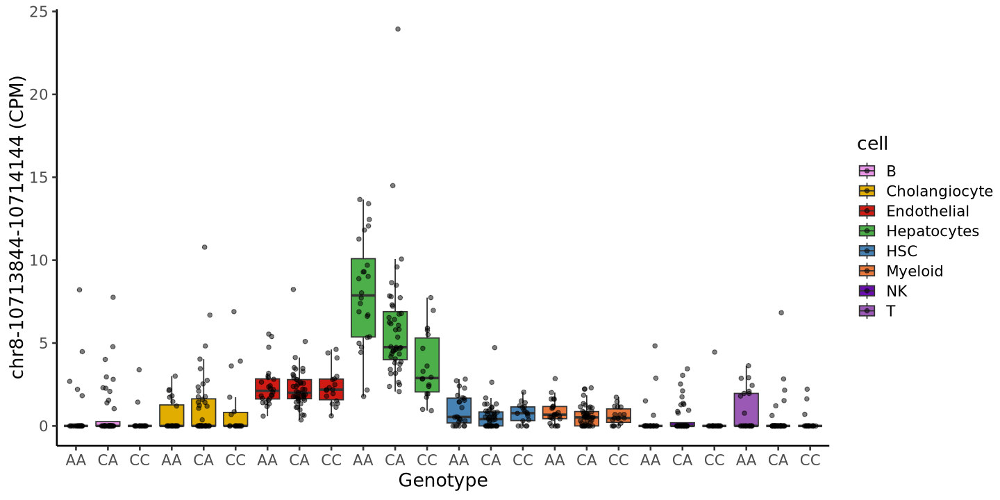

In [19]:
options(repr.plot.width=12, repr.plot.height=6)
qtl.boxplot('chr8-10713844-10714144','rs4484649', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM')

# Plot Colocs

In [35]:
coloc.res <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/qtl.coloc/gwas/coloc.res/241205_WE_Full_Coloc_Summary_Stats_PP4_0.8_r2_0.8_gwas_sig.tsv',
           sep='\t', header=T)

dim(coloc.res)
head(coloc.res)

[1] 62 16

,nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
1,2866,7.785105e-09,5.311408e-04,1.782465e-06,0.12073041,0.8787367,Hepatocytes,ATAC,chr1-16179136-16179436,rs6656611,6.831334e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2,2832,7.832685e-07,3.756671e-04,1.793359e-04,0.08509779,0.9143464,Hepatocytes,ATAC,chr1-16189049-16189288,rs6656611,3.613621e-09,16189310,rs1497406,1.458e-08,16178825,0.823
3,2825,4.295586e-14,2.657291e-04,9.835105e-12,0.05990109,0.9398332,Hepatocytes,ATAC,chr1-16189980-16190280,rs6690317,2.161590e-13,16190090,rs1497406,1.458e-08,16178825,0.823
4,2439,4.226498e-35,2.134257e-11,3.782529e-26,0.01811878,0.9818812,Hepatocytes,ATAC,chr11-61820741-61821041,rs174536,1.015739e-17,61784455,rs174535,3.105e-15,61783884,0.978
5,3137,6.809861e-28,1.723499e-26,6.380127e-04,0.01516318,0.9841988,Hepatocytes,ATAC,chr11-94132939-94133200,rs11607757,1.160876e-08,94132981,rs7117339,2.256e-30,94137172,1.000
6,3759,1.174897e-33,8.672100e-09,2.153630e-26,0.15812096,0.8418790,Hepatocytes,ATAC,chr12-52884847-52885147,rs4919766,5.638330e-18,52873026,rs4919741,1.721e-13,52879136,0.899


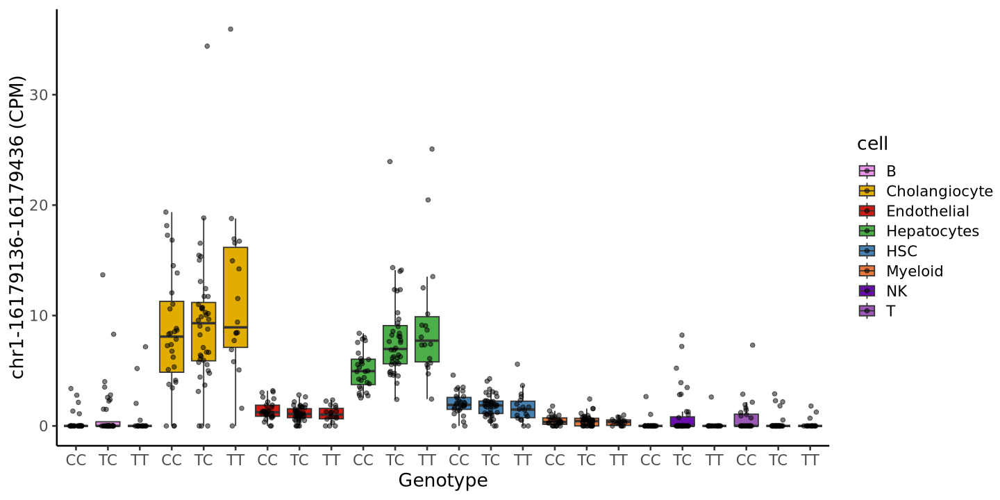

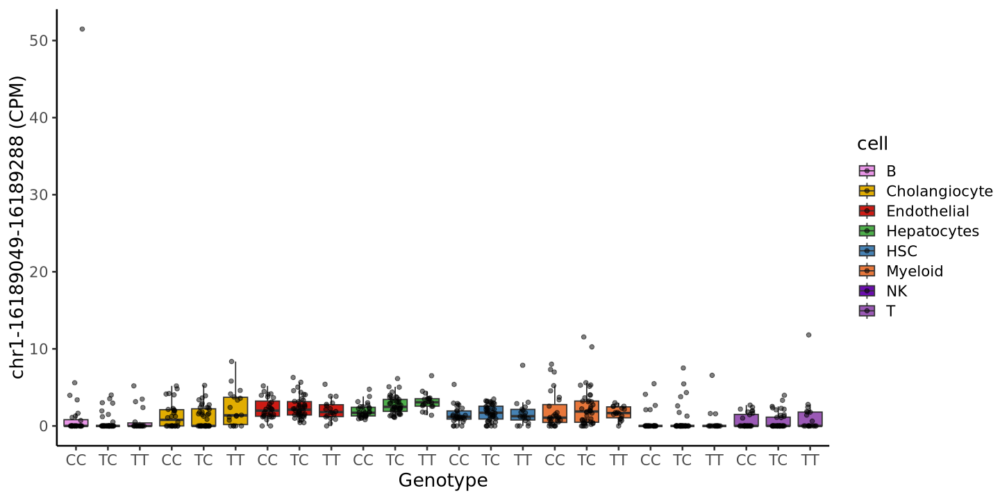

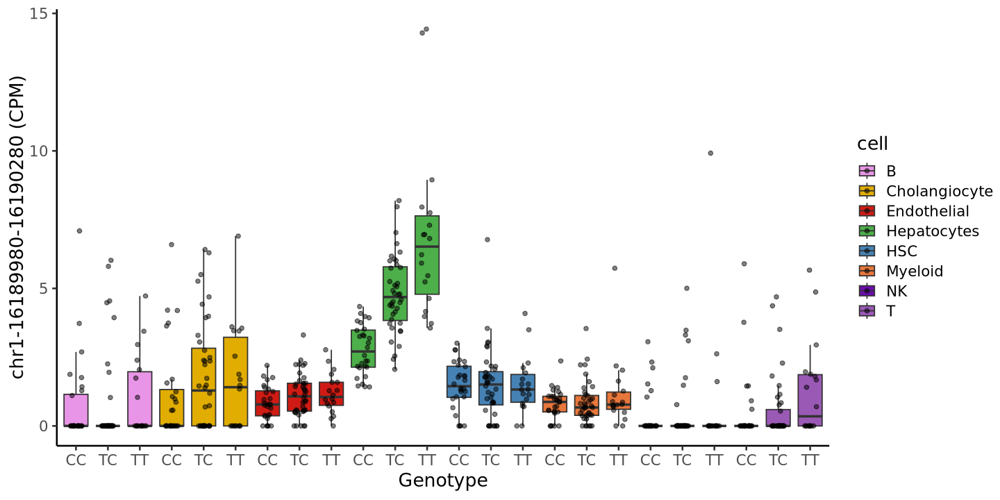

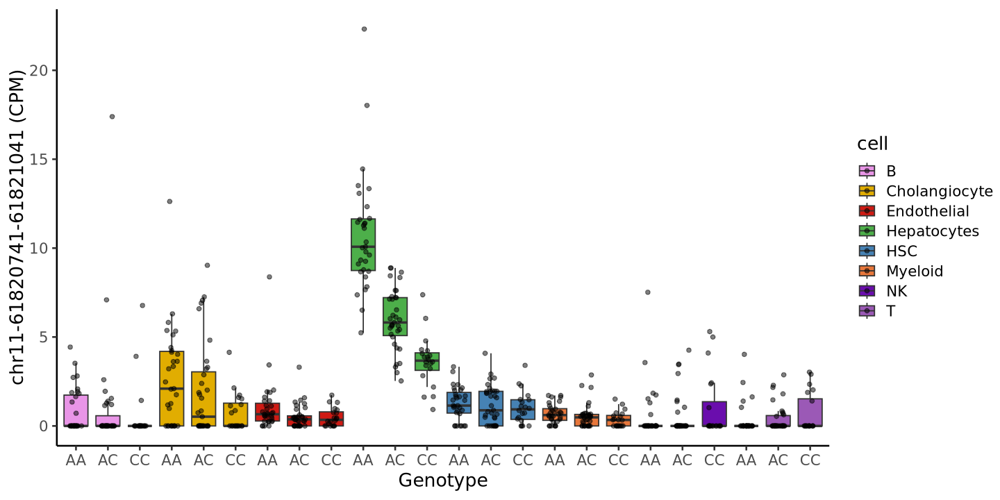

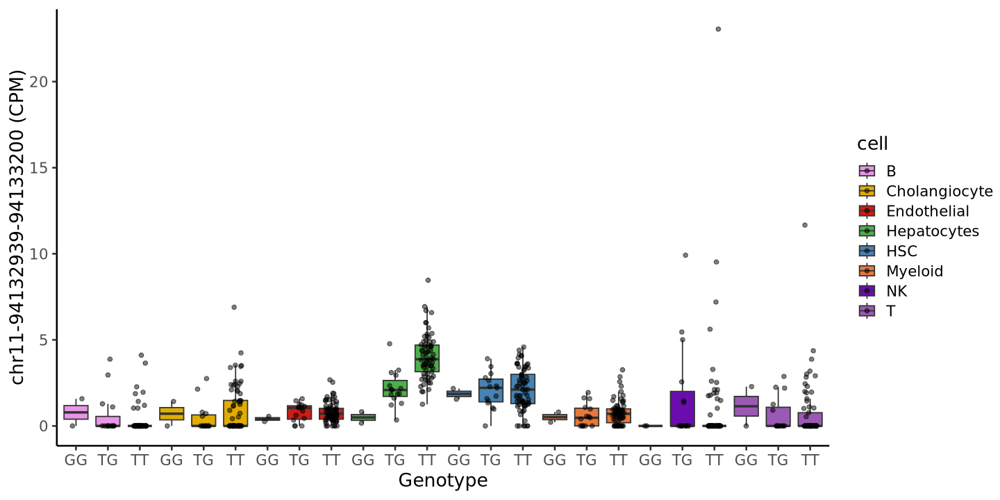

...

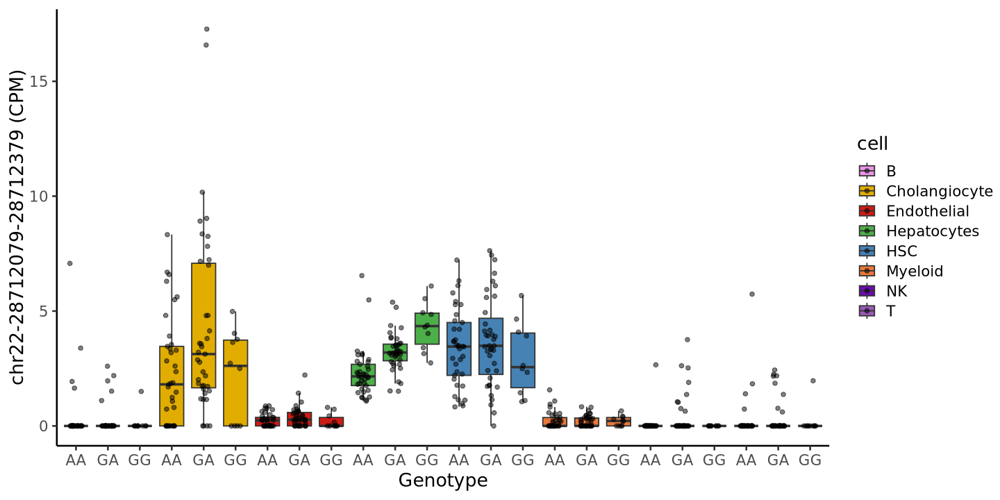

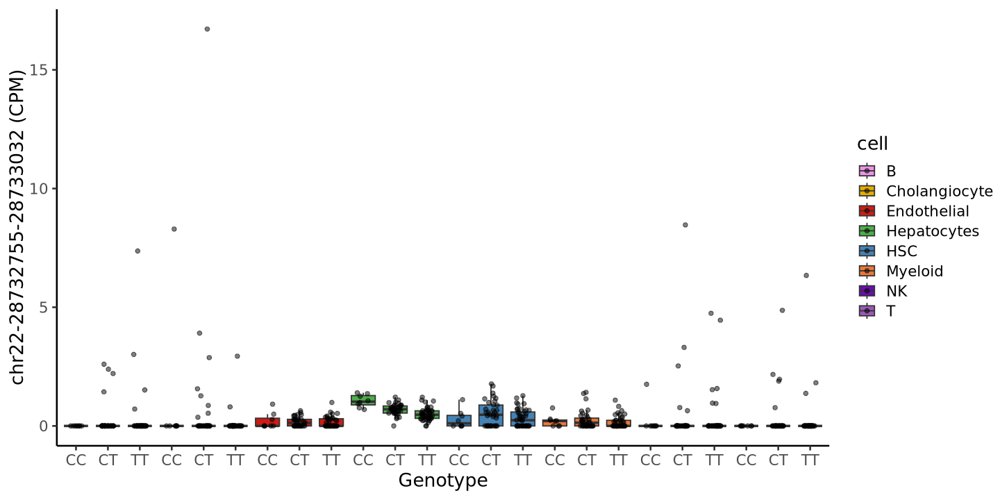

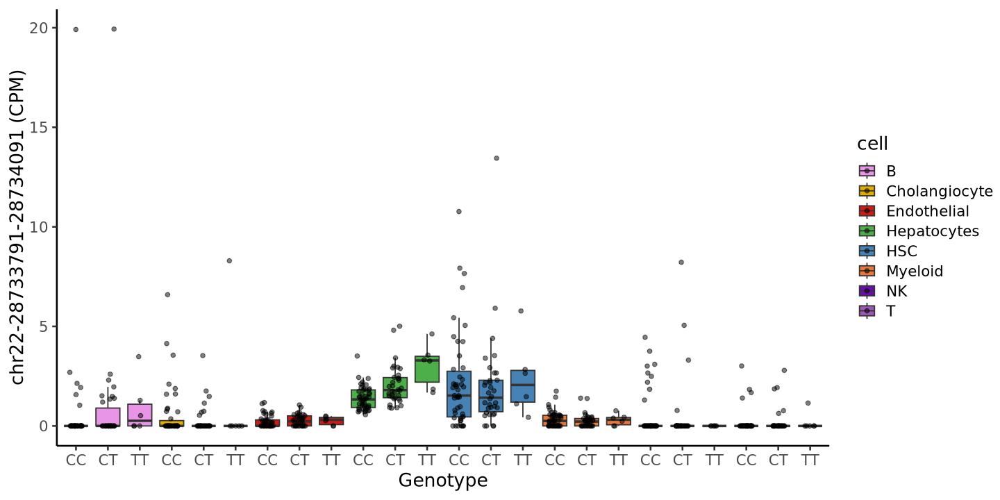

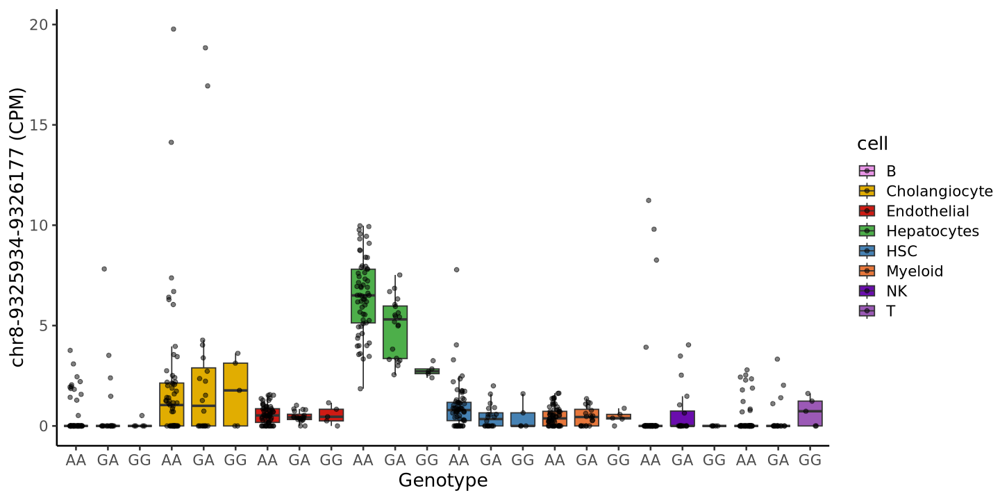

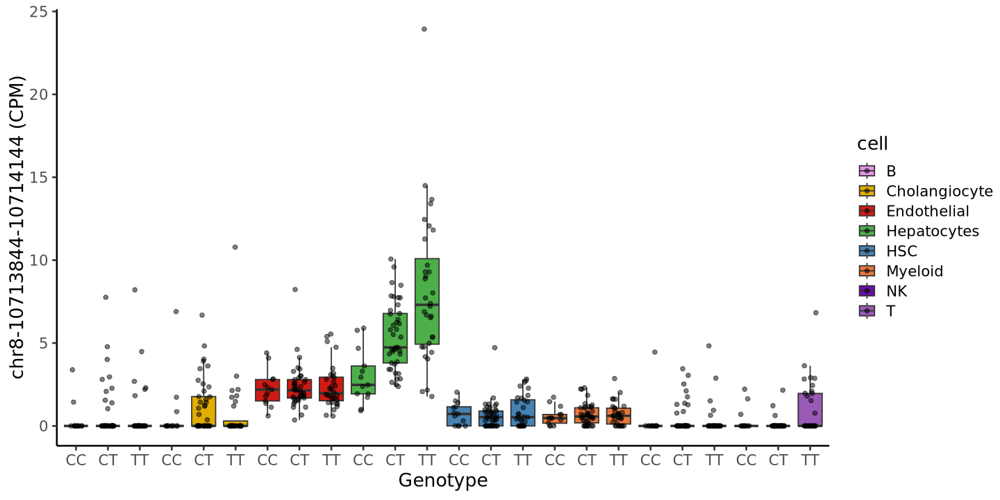

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


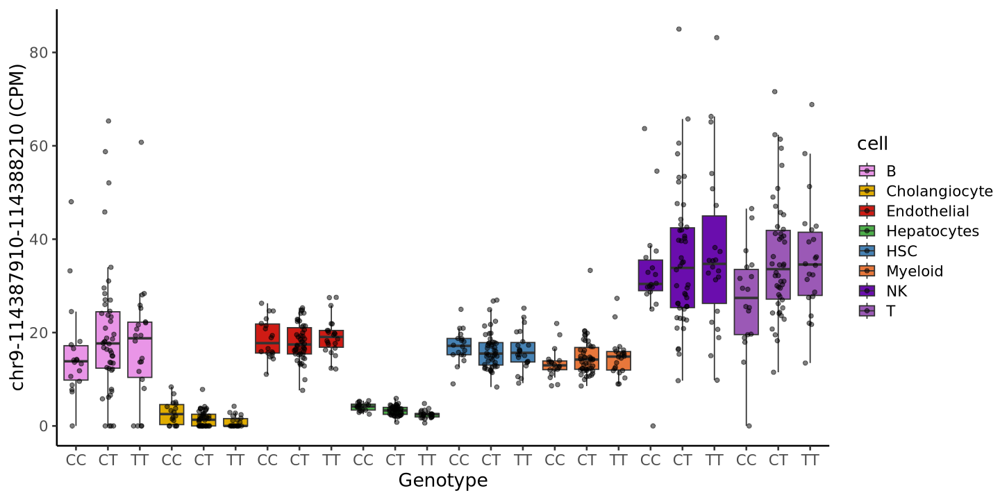

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


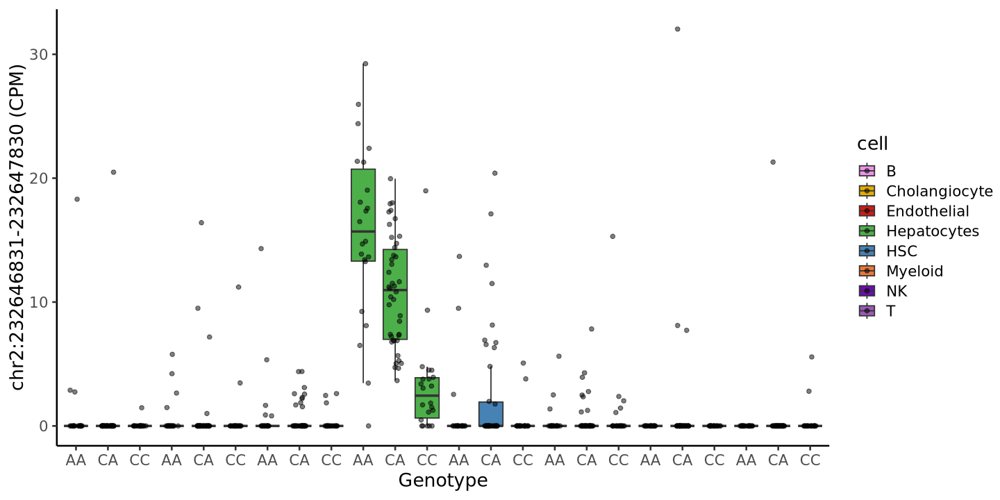

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


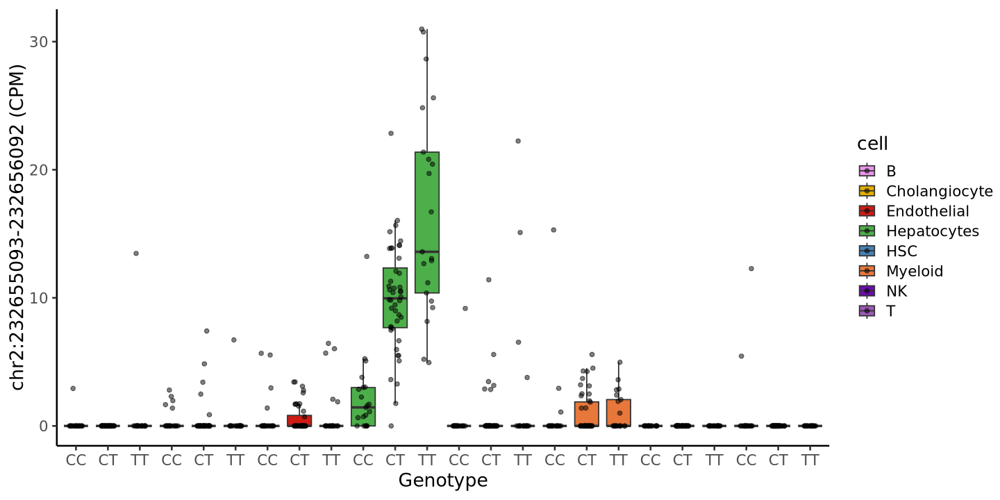

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


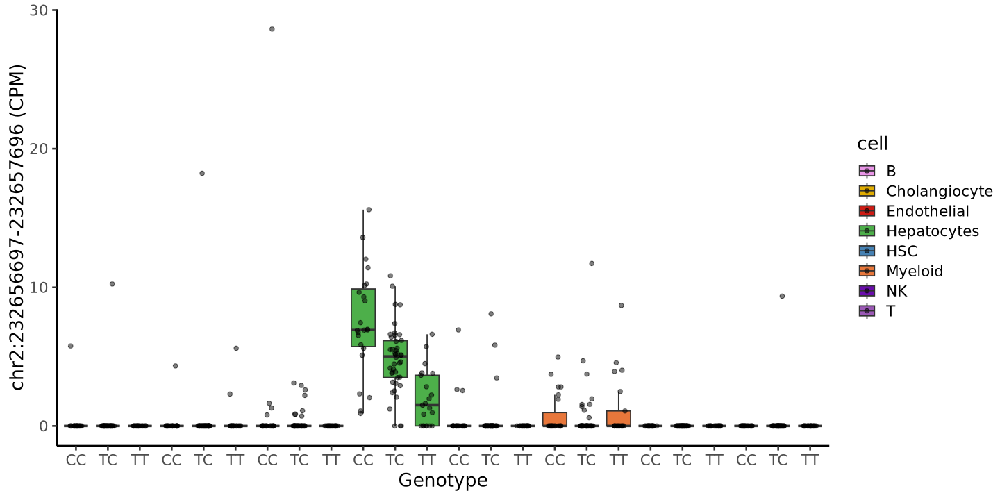

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


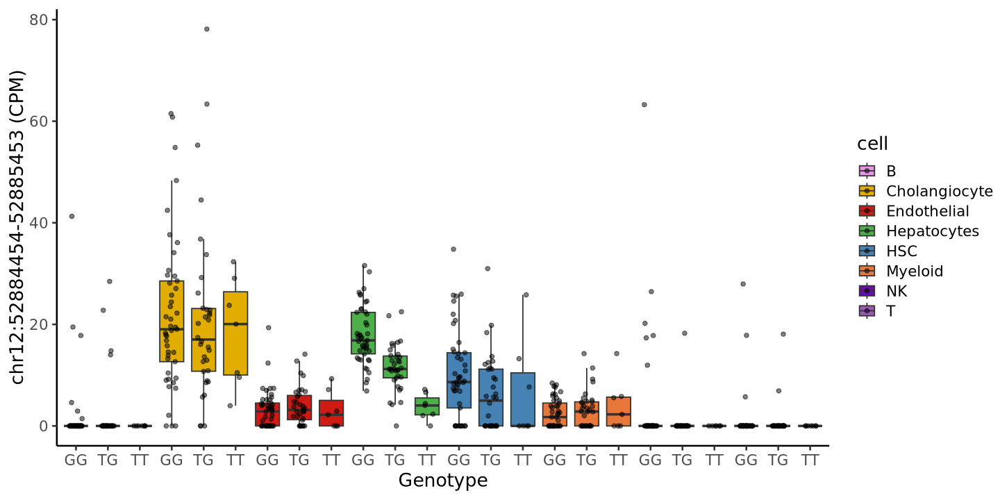

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


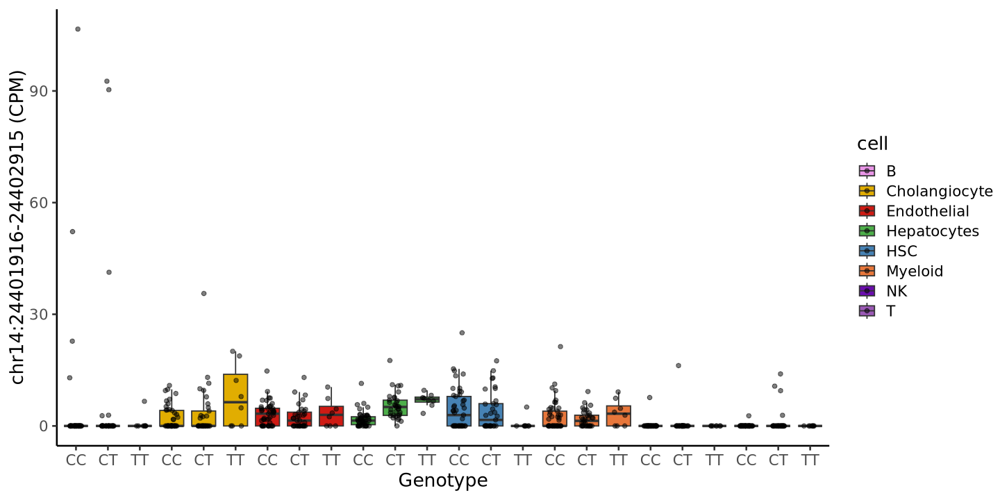

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


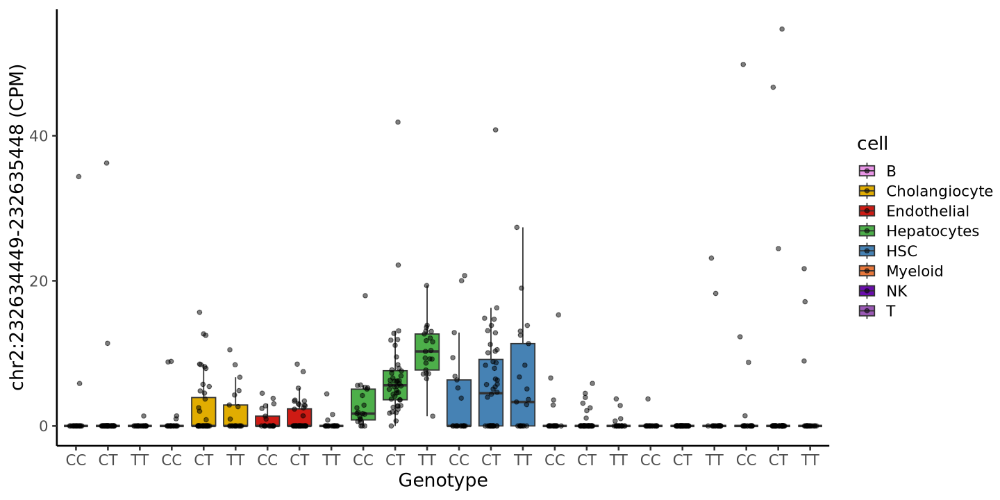

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


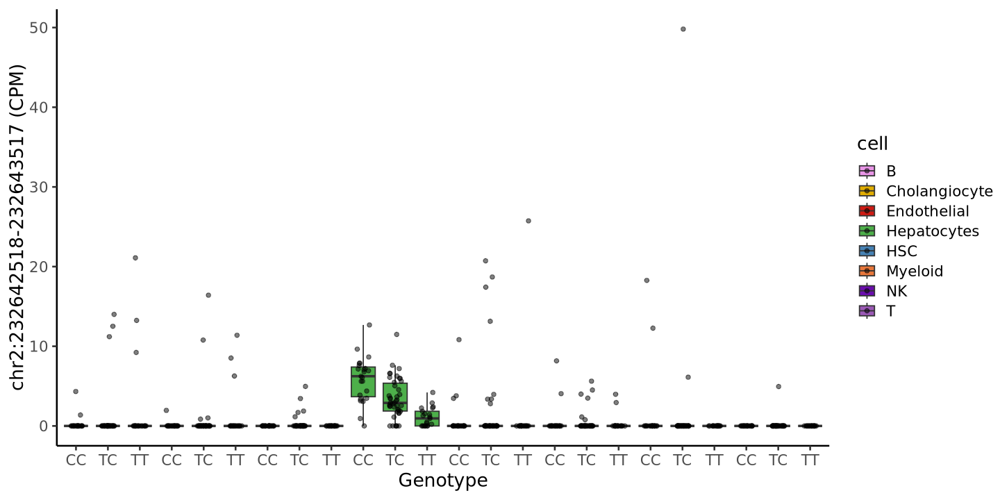

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


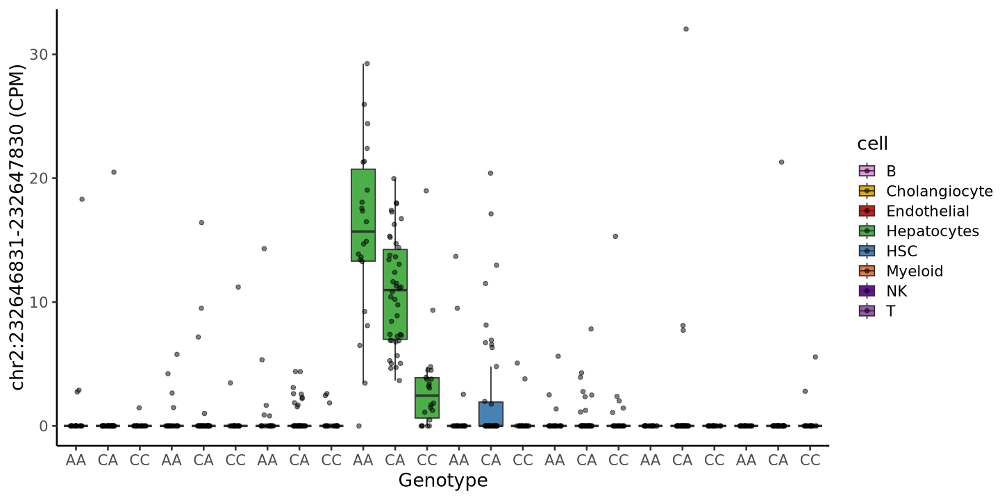

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


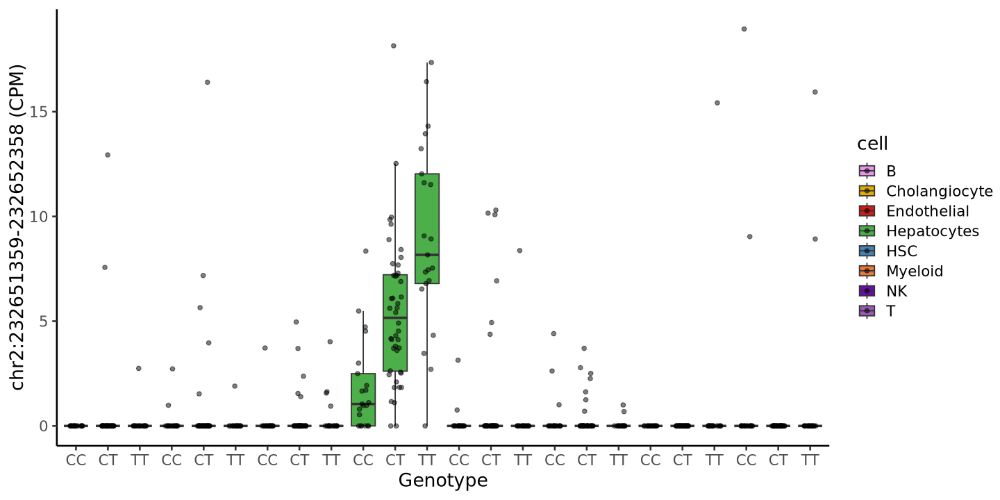

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


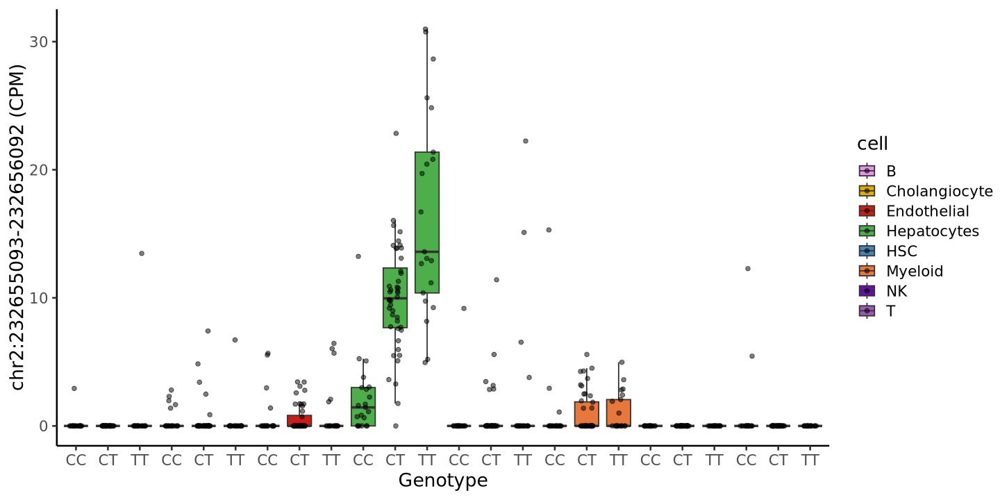

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


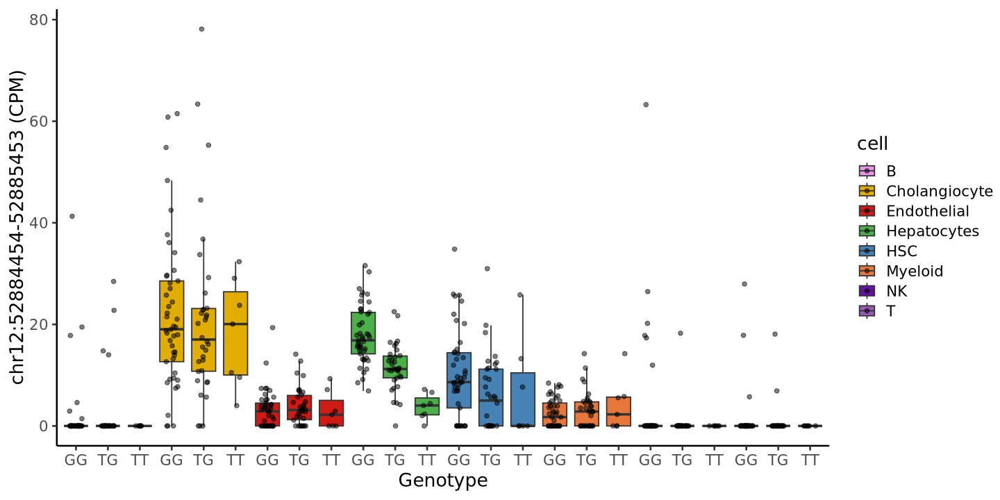

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


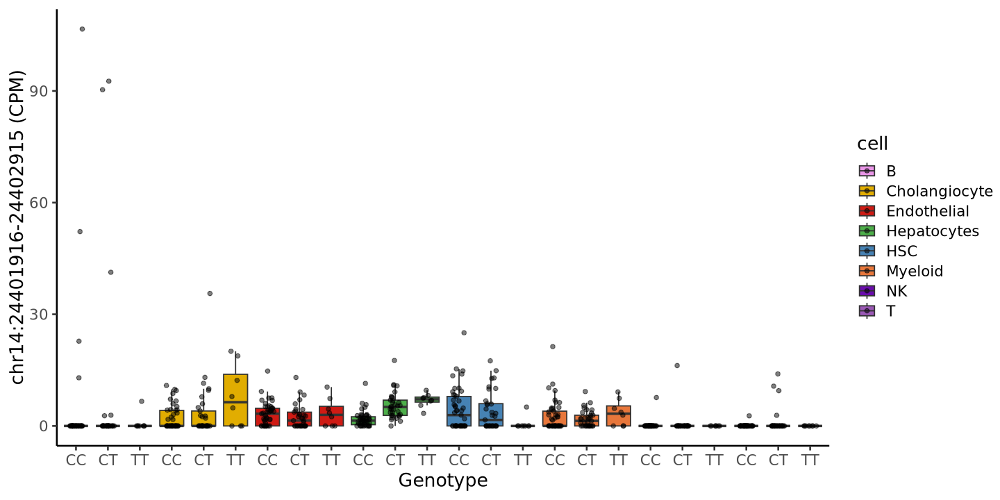

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


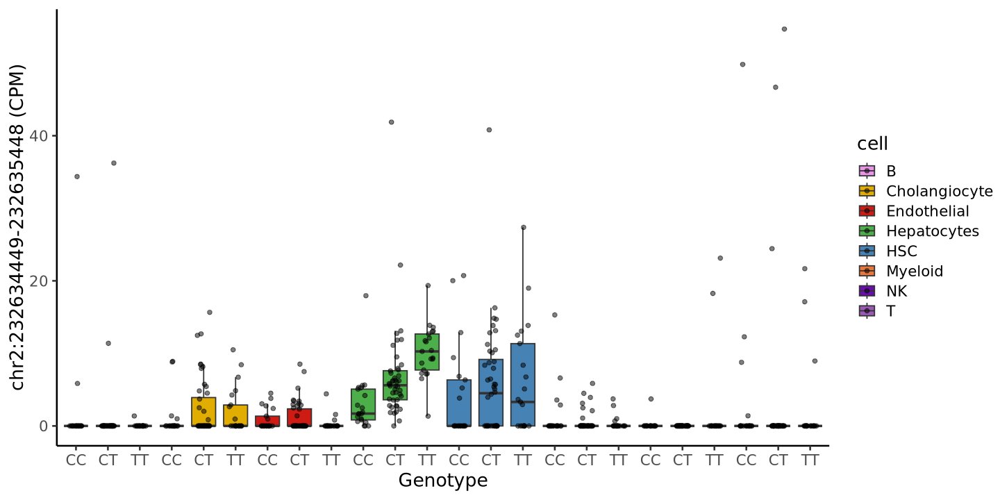

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


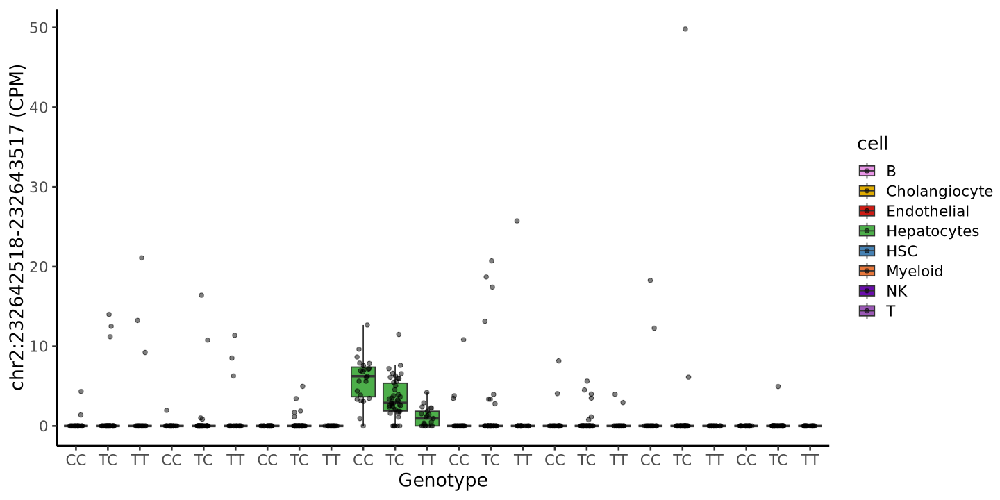

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


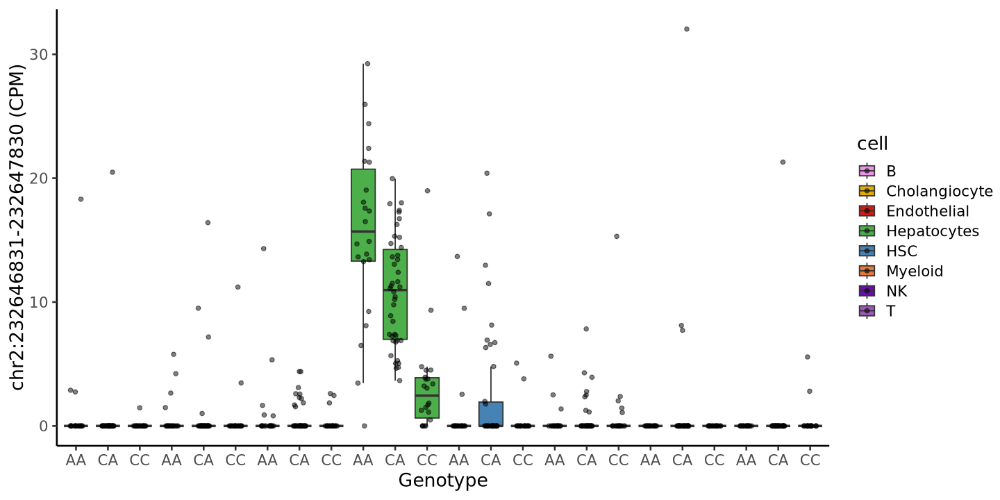

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


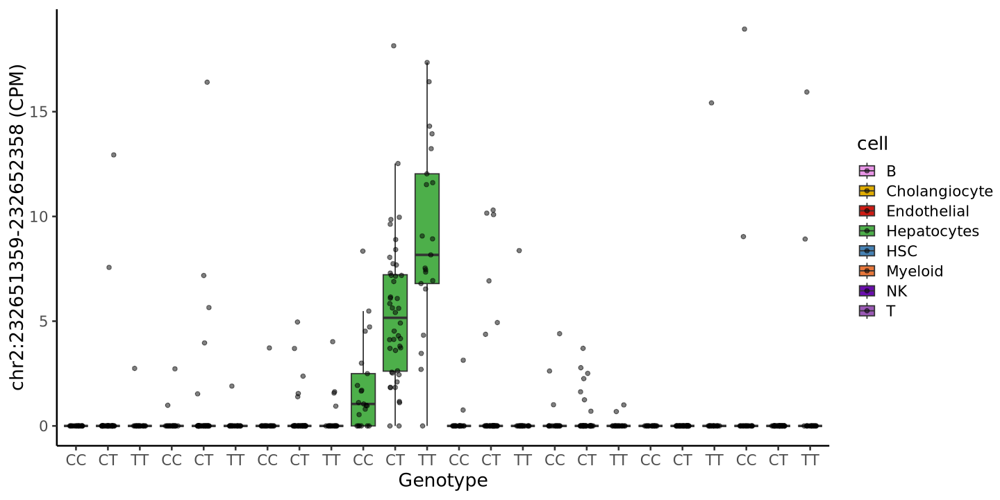

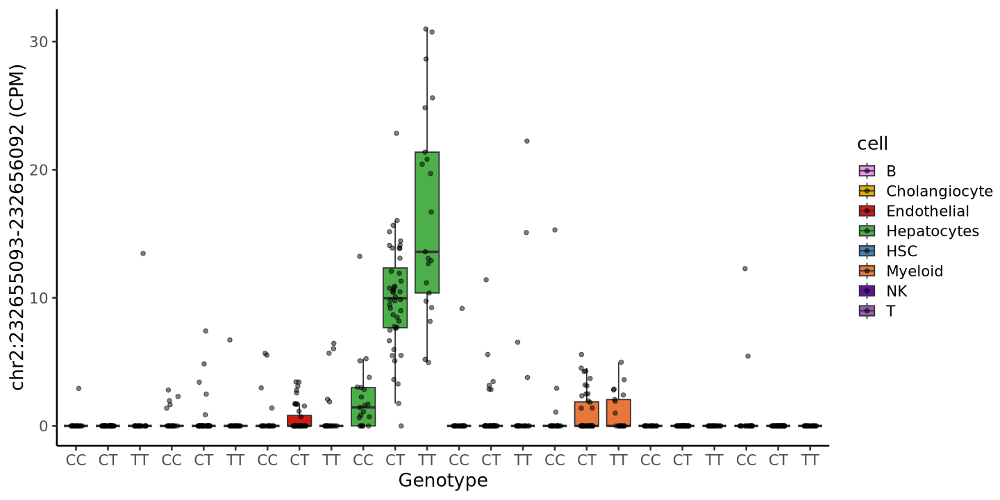

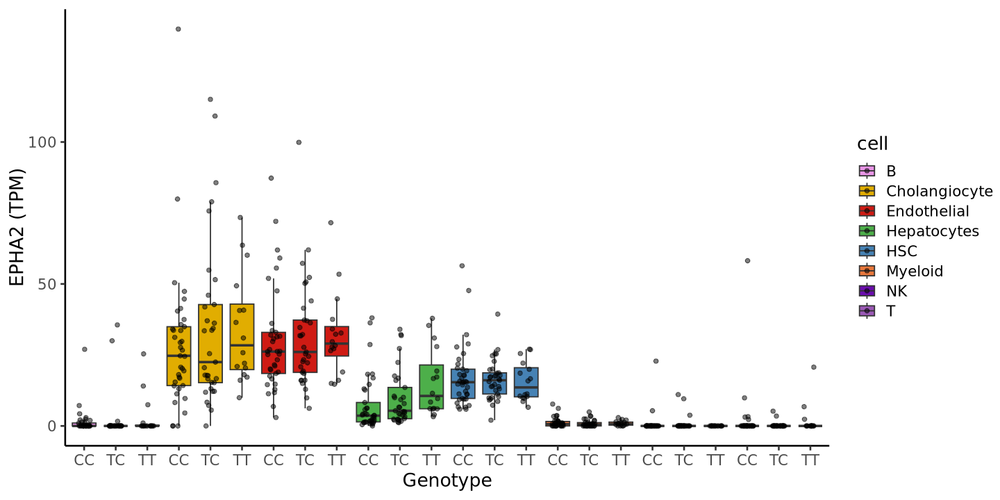

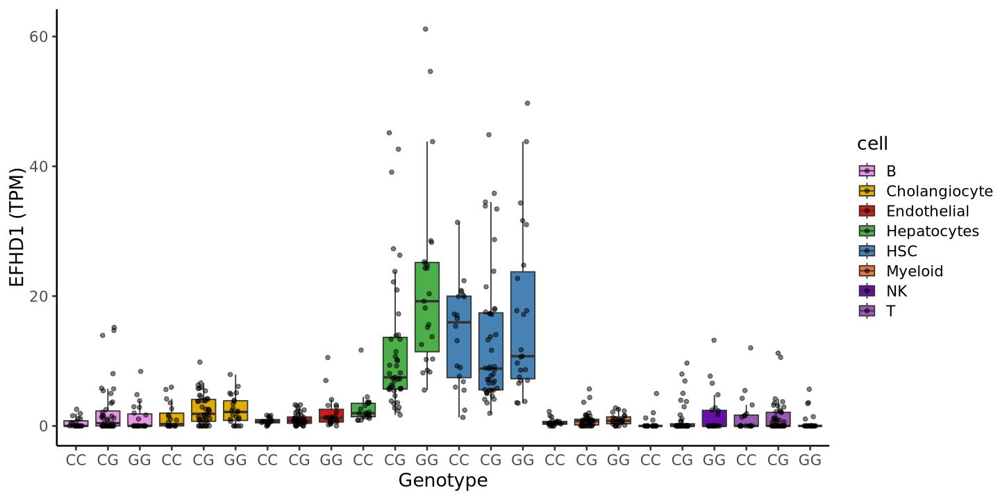

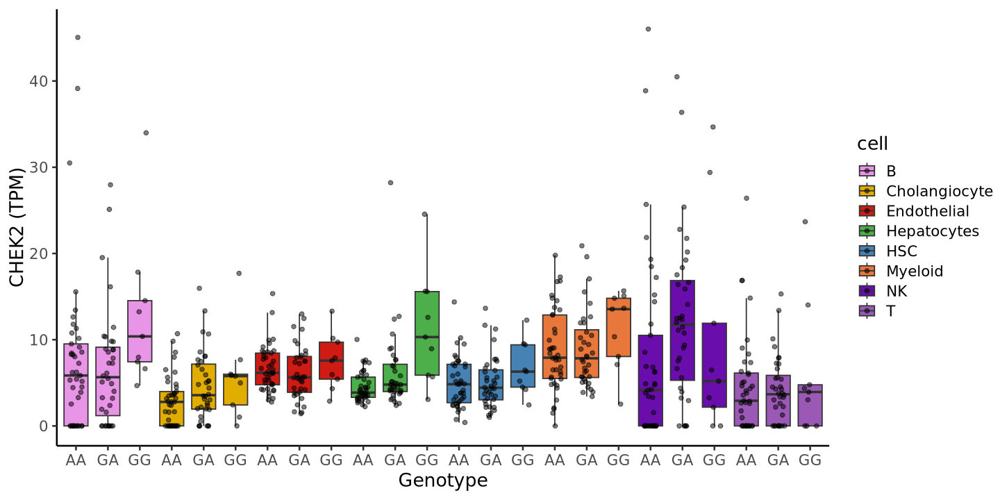

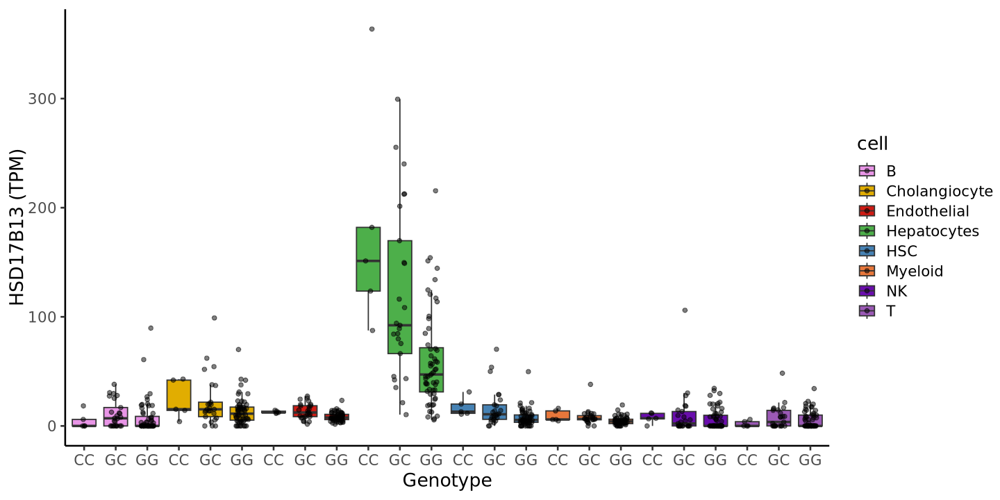

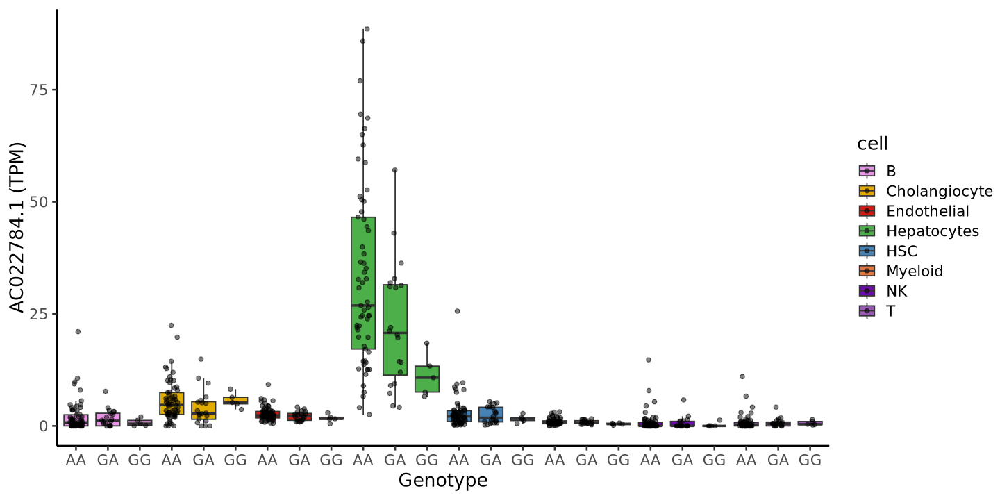

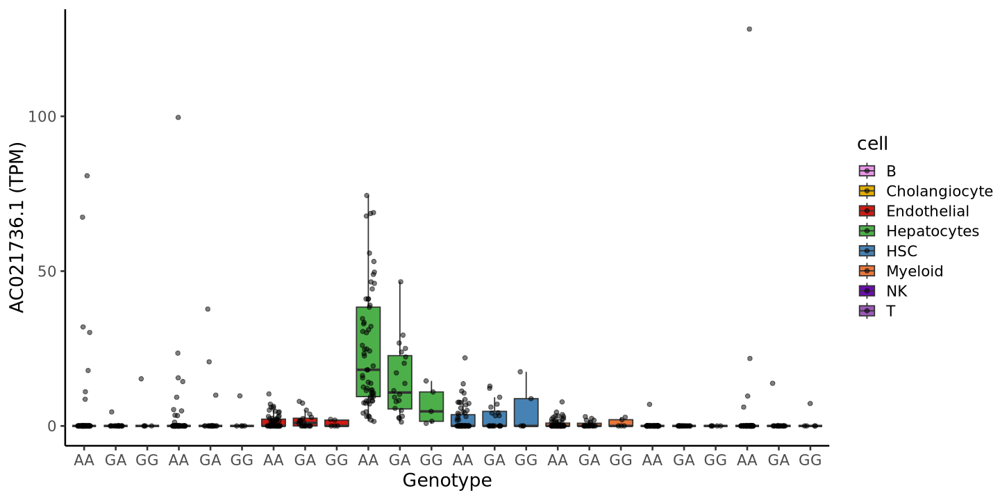

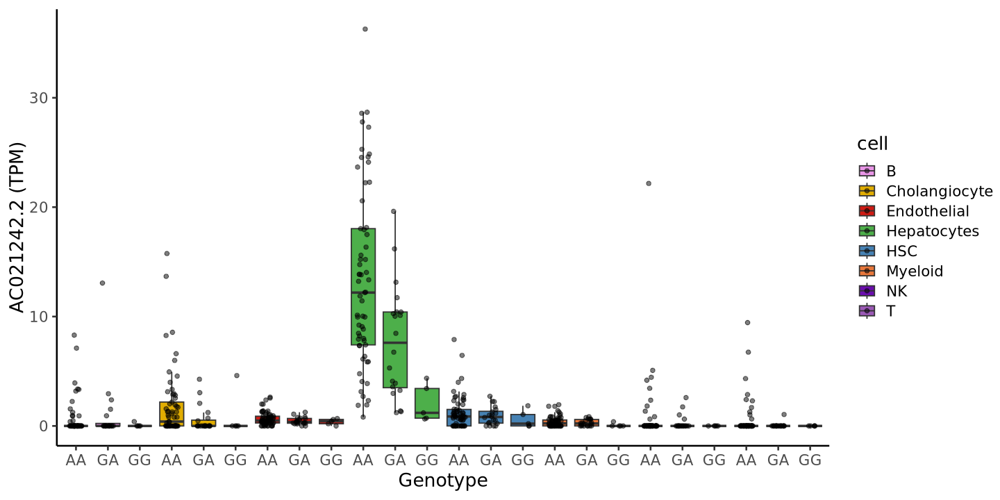

In [22]:
for (i in 1:nrow(coloc.res)) {
    if (coloc.res$modality[i] == 'RNA') {
        counts.list <- TPM
        unit <- 'TPM'
    }
    if (coloc.res$modality[i] == 'ATAC') {
        counts.list <- CPM.ATAC
        unit <- 'CPM'
    }
    if (coloc.res$modality[i] == 'H3K27ac') {
        counts.list <- CPM.H3K27ac
        unit <- 'CPM'
    }
    
    qtl.boxplot(coloc.res$feature[i],coloc.res$qtl.lead[i], vcf.df, 
                counts.list, celltype_colors, unit)
}

In [33]:
coloc.res %>%
    filter(gwas.lead=='rs7604422')

232645051

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2868,1.021755e-09,5.286654e-09,1.099240e-03,0.004693359,0.9942074,Hepatocytes,ATAC,chr2-232625035-232625335,rs2140773,1.370144e-07,232648465,rs7604422,1.238e-12,232645051,0.988
2857,1.544228e-10,5.086516e-09,1.661334e-04,0.004476894,0.9953570,Hepatocytes,ATAC,chr2-232630358-232630573,rs2140773,1.024331e-07,232648465,rs7604422,1.238e-12,232645051,0.988
2852,1.157110e-11,4.445423e-09,1.244859e-05,0.003786339,0.9962012,Hepatocytes,ATAC,chr2-232633413-232633713,rs11683367,1.774792e-08,232645301,rs7604422,1.238e-12,232645051,1.000
2850,6.122376e-14,5.194945e-09,6.586665e-08,0.004593496,0.9954064,Hepatocytes,ATAC,chr2-232634877-232635116,rs11689178,6.797369e-11,232645141,rs7604422,1.238e-12,232645051,0.956
2842,5.862667e-11,4.751358e-09,6.307260e-05,0.004115855,0.9958211,Hepatocytes,ATAC,chr2-232636795-232637095,rs7604422,8.428204e-08,232645051,rs7604422,1.238e-12,232645051,1.000
2837,7.803163e-18,4.506822e-09,8.394914e-12,0.003852448,0.9961475,Hepatocytes,ATAC,chr2-232642905-232643205,rs11683367,3.166449e-13,232645301,rs7604422,1.238e-12,232645051,1.000
2837,4.773806e-21,4.274958e-09,5.135826e-15,0.003602751,0.9963972,Hepatocytes,ATAC,chr2-232647251-232647551,rs11683367,5.906627e-14,232645301,rs7604422,1.238e-12,232645051,1.000
2837,3.401286e-11,6.493321e-09,3.659221e-05,0.005991769,0.9939716,Hepatocytes,ATAC,chr2-232649192-232649393,rs4973050,2.525626e-09,232649928,rs7604422,1.238e-12,232645051,0.947
2835,1.124735e-22,3.967666e-09,1.210029e-16,0.003271825,0.9967282,Hepatocytes,ATAC,chr2-232651647-232651947,rs7604422,4.459065e-15,232645051,rs7604422,1.238e-12,232645051,1.000


In [16]:
coloc.res

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2913,9.849950e-07,5.007827e-05,2.255228e-04,0.010476587,0.9892468,Hepatocytes,ATAC,chr1-16164190-16164400,rs28629977,5.535157e-07,16170777,rs1497406,1.458e-08,16178825,0.815
2832,5.692557e-07,3.440368e-04,1.303359e-04,0.077848441,0.9216766,Hepatocytes,ATAC,chr1-16188987-16189287,rs6656611,2.404508e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2825,1.168992e-12,1.099061e-04,2.676506e-10,0.024188227,0.9757019,Hepatocytes,ATAC,chr1-16190037-16190337,rs1497406,1.473445e-12,16178825,rs1497406,1.458e-08,16178825,1.000
2439,6.194973e-28,2.830836e-11,5.544227e-19,0.024359088,0.9756409,Hepatocytes,ATAC,chr11-61820562-61820830,rs174536,1.042014e-15,61784455,rs174535,3.105e-15,61783884,0.978
3759,9.862962e-33,4.968566e-09,1.807918e-25,0.090165848,0.9098341,Hepatocytes,ATAC,chr12-52884847-52885147,rs4919766,1.227824e-17,52873026,rs4919741,1.721e-13,52879136,0.899
3412,7.303919e-08,6.285081e-05,5.560445e-06,0.003788665,0.9961429,Hepatocytes,ATAC,chr14-24402365-24402665,rs11621792,1.580335e-09,24402720,rs11621792,1.114e-08,24402720,1.000
3192,4.542176e-20,1.476332e-05,7.770126e-17,0.024279337,0.9757059,Hepatocytes,ATAC,chr15-89803834-89804134,rs72754570,5.818765e-16,89805748,rs72754571,2.467e-09,89807657,0.862
2857,3.147337e-11,4.963771e-09,3.386015e-05,0.004344576,0.9956216,Hepatocytes,ATAC,chr2-232630285-232630522,rs2140773,3.129548e-08,232648465,rs7604422,1.238e-12,232645051,0.988
2852,5.825289e-13,4.502646e-09,6.267048e-07,0.003847952,0.9961514,Hepatocytes,ATAC,chr2-232633359-232633659,rs11683367,2.610760e-09,232645301,rs7604422,1.238e-12,232645051,1.000


In [23]:
filter(coloc.res, gwas.lead=='rs7604422')

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2857,3.147337e-11,4.963771e-09,3.386015e-05,0.004344576,0.9956216,Hepatocytes,ATAC,chr2-232630285-232630522,rs2140773,3.129548e-08,232648465,rs7604422,1.238e-12,232645051,0.988
2852,5.825289e-13,4.502646e-09,6.267048e-07,0.003847952,0.9961514,Hepatocytes,ATAC,chr2-232633359-232633659,rs11683367,2.610760e-09,232645301,rs7604422,1.238e-12,232645051,1.000
2850,6.120780e-14,6.806535e-09,6.584948e-08,0.006329036,0.9936709,Hepatocytes,ATAC,chr2-232634360-232634660,rs11689178,3.808140e-11,232645141,rs7604422,1.238e-12,232645051,0.956
2850,1.141901e-14,6.057141e-09,1.228497e-08,0.005522005,0.9944780,Hepatocytes,ATAC,chr2-232634838-232635138,rs11689178,1.529645e-11,232645141,rs7604422,1.238e-12,232645051,0.956
2837,5.718959e-18,4.638630e-09,6.152655e-12,0.003994393,0.9960056,Hepatocytes,ATAC,chr2-232642898-232643198,rs11683367,2.664041e-13,232645301,rs7604422,1.238e-12,232645051,1.000
2837,1.678744e-20,4.269696e-09,1.806052e-14,0.003597085,0.9964029,Hepatocytes,ATAC,chr2-232647213-232647513,rs11683367,9.836419e-14,232645301,rs7604422,1.238e-12,232645051,1.000
2832,7.843163e-38,3.948455e-09,8.437947e-32,0.003251136,0.9967489,Hepatocytes,ATAC,chr2-232655472-232655697,rs7604422,3.790168e-19,232645051,rs7604422,1.238e-12,232645051,1.000
2836,4.607006e-22,4.572983e-09,4.956377e-16,0.003923697,0.9960763,Hepatocytes,ATAC,chr2-232658271-232658571,rs2140773,6.769846e-15,232648465,rs7604422,1.238e-12,232645051,0.988
2838,5.517444e-14,4.368508e-09,5.935858e-08,0.003703496,0.9962964,Hepatocytes,ATAC,chr2-232667947-232668247,rs11683367,1.109020e-10,232645301,rs7604422,1.238e-12,232645051,1.000


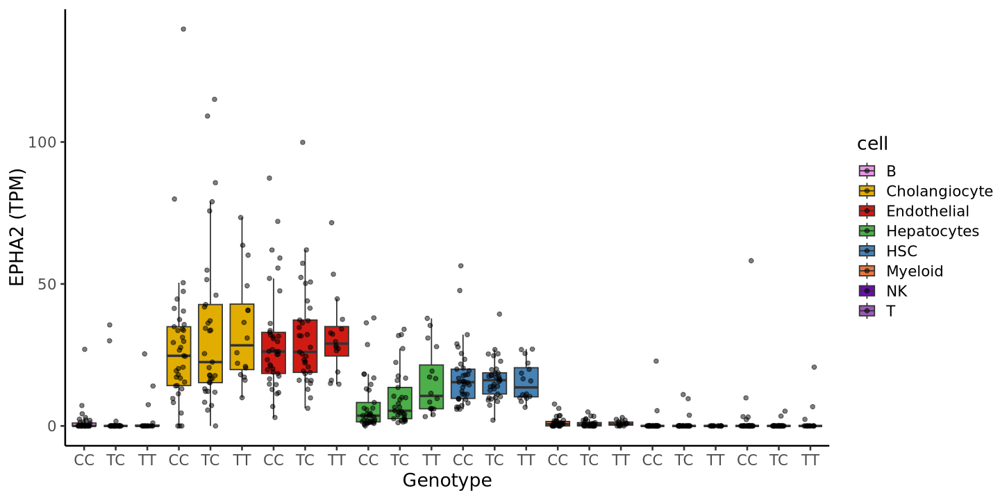

In [11]:
options(repr.plot.width=12, repr.plot.height=6)
qtl.boxplot('EPHA2','rs7538833',vcf.df,TPM,celltype_colors, 'TPM')

In [44]:
read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/qtl.coloc/gwas/coloc.res/241009_WE_Full_Coloc_Summary_Stats_PP4_0.8_r2_0.8_gwas_sig.tsv',
           sep='\t', header=T)

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2913,9.849950e-07,5.007827e-05,2.255228e-04,0.010476587,0.9892468,Hepatocytes,ATAC,chr1-16164190-16164400,rs28629977,5.535157e-07,16170777,rs1497406,1.458e-08,16178825,0.815
2832,5.692557e-07,3.440368e-04,1.303359e-04,0.077848441,0.9216766,Hepatocytes,ATAC,chr1-16188987-16189287,rs6656611,2.404508e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2825,1.168992e-12,1.099061e-04,2.676506e-10,0.024188227,0.9757019,Hepatocytes,ATAC,chr1-16190037-16190337,rs1497406,1.473445e-12,16178825,rs1497406,1.458e-08,16178825,1.000
2439,6.194973e-28,2.830836e-11,5.544227e-19,0.024359088,0.9756409,Hepatocytes,ATAC,chr11-61820562-61820830,rs174536,1.042014e-15,61784455,rs174535,3.105e-15,61783884,0.978
3759,9.862962e-33,4.968566e-09,1.807918e-25,0.090165848,0.9098341,Hepatocytes,ATAC,chr12-52884847-52885147,rs4919766,1.227824e-17,52873026,rs4919741,1.721e-13,52879136,0.899
3412,7.303919e-08,6.285081e-05,5.560445e-06,0.003788665,0.9961429,Hepatocytes,ATAC,chr14-24402365-24402665,rs11621792,1.580335e-09,24402720,rs11621792,1.114e-08,24402720,1.000
3192,4.542176e-20,1.476332e-05,7.770126e-17,0.024279337,0.9757059,Hepatocytes,ATAC,chr15-89803834-89804134,rs72754570,5.818765e-16,89805748,rs72754571,2.467e-09,89807657,0.862
2857,3.147337e-11,4.963771e-09,3.386015e-05,0.004344576,0.9956216,Hepatocytes,ATAC,chr2-232630285-232630522,rs2140773,3.129548e-08,232648465,rs7604422,1.238e-12,232645051,0.988
2852,5.825289e-13,4.502646e-09,6.267048e-07,0.003847952,0.9961514,Hepatocytes,ATAC,chr2-232633359-232633659,rs11683367,2.610760e-09,232645301,rs7604422,1.238e-12,232645051,1.000


In [25]:
ALT <- vroom('/nfs/lab/projects/nash_nafld_liver/GWAS/MVP_GWAS/NAFLD.EUR.MVP.2021.hg38.tsv', delim='\t')

dim(ALT)
head(ALT)

Rows: 11657625 Columns: 13
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (3): RSID, EA, NEA
dbl (10): CHR, POS, EAF, BETA, SE, P, N, OR, chr.hg38, pos.hg38

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 11657625       13

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
rs542222769,1,324826,G,A,0.0062,0.0396,0.0783,0.6128,164197,1.040,1,494511
rs559154412,1,727162,C,T,0.0020,-0.0970,0.1373,0.4799,164197,0.908,1,791782
rs182373484,1,748332,C,T,0.0054,0.0525,0.0664,0.4285,164197,1.054,1,812952
rs28544273,1,751343,A,T,0.1443,0.0006,0.0109,0.9584,164197,1.001,1,815963
rs28527770,1,751756,C,T,0.1438,0.0006,0.0109,0.9551,164197,1.001,1,816376
rs3094315,1,752566,A,G,0.8445,0.0010,0.0105,0.9236,164197,1.001,1,817186


In [21]:
filter(ALT, RSID=='rs7604422')

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
rs7604422,2,233509761,A,C,0.5995,0.053,0.0075,1.238e-12,164197,1.054,2,232645051


In [81]:
options(repr.plot.width=12, repr.plot.height=6)

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_eQTL_boxplot.pdf', width=12, heigh=6)
qtl.boxplot('EFHD1','rs7604422', vcf.df, 
                TPM, celltype_colors, 'TPM')
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_caQTL_boxplot.pdf', width=12, heigh=6)
qtl.boxplot('chr2-232647251-232647551','rs7604422', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM')
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_H3K27acQTL_boxplot.pdf', width=12, heigh=6)
qtl.boxplot('chr2:232646831-232647830','rs7604422', vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
dev.off()

pdf 
  2

pdf 
  2

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

In [209]:
options(repr.plot.width=14, repr.plot.height=4)

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_eQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('EFHD1','rs7604422', vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_caQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('chr2-232647251-232647551','rs7604422', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM', ylims=c(0,18))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_H3K27acQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('chr2:232646831-232647830','rs7604422', vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
dev.off()

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 123 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 157 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

In [24]:
filter(ALT, chr.hg38 == 2 & pos.hg38 > 231645051 & pos.hg38 < 233645051)

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
rs113799887,2,232509783,A,T,0.0849,-0.0124,0.0141,0.37850,164197,0.988,2,231645072
rs111456395,2,232510055,A,G,0.0825,-0.0127,0.0142,0.37100,164197,0.987,2,231645344
rs188252705,2,232510338,A,G,0.0012,0.1692,0.1222,0.16610,164197,1.184,2,231645627
rs112996705,2,232510510,G,A,0.0039,0.0282,0.0660,0.66900,164197,1.029,2,231645799
rs116804510,2,232510869,A,T,0.0033,0.0351,0.0764,0.64550,164197,1.036,2,231646158
rs375886979,2,232511625,T,C,0.0034,0.0073,0.0761,0.92340,164197,1.007,2,231646914
rs59276581,2,232512326,T,A,0.0013,-0.0153,0.1611,0.92450,164197,0.985,2,231647615
rs73097968,2,232512440,T,A,0.0972,-0.0219,0.0134,0.10180,164197,0.978,2,231647729
rs113500090,2,232512916,T,C,0.0860,-0.0156,0.0141,0.27050,164197,0.985,2,231648205


In [349]:
EFHD1.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr2.parquet.tsv') %>%
    filter(phenotype_id == 'EFHD1')

dim(EFHD1.qtl.res)
head(EFHD1.qtl.res)

Rows: 5415703 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 3621    9

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
EFHD1,rs6720815,-999932,0.3779070,54,65,0.9329331,-0.01445592,0.1709629
EFHD1,rs1897809,-999073,0.3779070,54,65,0.9329331,-0.01445592,0.1709629
EFHD1,rs80258191,-998742,0.0872093,13,15,0.1219851,0.40917253,0.2603472
EFHD1,rs10175445,-998627,0.4069767,56,70,0.7705016,0.04948442,0.1687640
EFHD1,rs10210477,-998375,0.4069767,56,70,0.7705016,0.04948442,0.1687640
EFHD1,rs4973452,-997723,0.9302325,12,12,0.2057294,0.42318577,0.3303253


In [350]:
EFHD1.qtl.res$snp.id <- rownames(vcf.df[match(EFHD1.qtl.res$variant_id, vcf.df$ID),])
EFHD1.qtl.res$pos <- as.numeric(str_split(EFHD1.qtl.res$snp.id, ':', simplify=T)[,2])

dim(EFHD1.qtl.res)
head(EFHD1.qtl.res)

[1] 3621   11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
EFHD1,rs6720815,-999932,0.3779070,54,65,0.9329331,-0.01445592,0.1709629,chr2:231606125:T:C,231606125
EFHD1,rs1897809,-999073,0.3779070,54,65,0.9329331,-0.01445592,0.1709629,chr2:231606984:A:G,231606984
EFHD1,rs80258191,-998742,0.0872093,13,15,0.1219851,0.40917253,0.2603472,chr2:231607315:T:A,231607315
EFHD1,rs10175445,-998627,0.4069767,56,70,0.7705016,0.04948442,0.1687640,chr2:231607430:T:C,231607430
EFHD1,rs10210477,-998375,0.4069767,56,70,0.7705016,0.04948442,0.1687640,chr2:231607682:G:A,231607682
EFHD1,rs4973452,-997723,0.9302325,12,12,0.2057294,0.42318577,0.3303253,chr2:231608334:G:A,231608334


In [356]:
ATAC.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr2.parquet.tsv') %>%
    filter(phenotype_id == 'chr2-232647251-232647551')

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

Rows: 173859072 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 3575   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr2-232647251-232647551,rs113500090,-999047,-999346,0.09883721,15,17,0.99034663,-0.003192732,0.2626421
chr2-232647251-232647551,rs11685287,-998539,-998838,0.59302324,54,70,0.07262212,-0.309748300,0.1691065
chr2-232647251-232647551,rs9288673,-997171,-997470,0.92441860,13,13,0.94016765,-0.028109150,0.3727211
chr2-232647251-232647551,rs28430312,-996777,-997076,0.17441860,27,30,0.85122394,0.041297270,0.2191124
chr2-232647251-232647551,rs112863428,-996511,-996810,0.12790698,20,22,0.09935433,0.381913930,0.2276830
chr2-232647251-232647551,rs13015276,-995371,-995670,0.94186044,10,10,0.89775583,-0.051575500,0.3994557


In [357]:
ATAC.qtl.res$snp.id <- rownames(vcf.df[match(ATAC.qtl.res$variant_id, vcf.df$ID),])
ATAC.qtl.res$pos <- as.numeric(str_split(ATAC.qtl.res$snp.id, ':', simplify=T)[,2])

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

[1] 3575   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr2-232647251-232647551,rs113500090,-999047,-999346,0.09883721,15,17,0.99034663,-0.003192732,0.2626421,chr2:231648205:C:T,231648205
chr2-232647251-232647551,rs11685287,-998539,-998838,0.59302324,54,70,0.07262212,-0.309748300,0.1691065,chr2:231648713:A:G,231648713
chr2-232647251-232647551,rs9288673,-997171,-997470,0.92441860,13,13,0.94016765,-0.028109150,0.3727211,chr2:231650081:A:T,231650081
chr2-232647251-232647551,rs28430312,-996777,-997076,0.17441860,27,30,0.85122394,0.041297270,0.2191124,chr2:231650475:T:G,231650475
chr2-232647251-232647551,rs112863428,-996511,-996810,0.12790698,20,22,0.09935433,0.381913930,0.2276830,chr2:231650741:C:T,231650741
chr2-232647251-232647551,rs13015276,-995371,-995670,0.94186044,10,10,0.89775583,-0.051575500,0.3994557,chr2:231651881:A:G,231651881


In [358]:
H3K27ac.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr2.parquet.tsv') %>%
    filter(phenotype_id == 'chr2:232646831-232647830')

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

Rows: 77947148 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 3577   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr2:232646831-232647830,rs9989905,-999595,-1000593,0.29651162,44,51,0.4670899,0.12540042,0.1711948
chr2:232646831-232647830,rs113500090,-998627,-999625,0.09883721,15,17,0.8231266,-0.05552128,0.2471616
chr2:232646831-232647830,rs11685287,-998119,-999117,0.59302324,54,70,0.8375095,-0.03329152,0.1615380
chr2:232646831-232647830,rs9288673,-996751,-997749,0.92441860,13,13,0.9724009,-0.01338713,0.3851197
chr2:232646831-232647830,rs28430312,-996357,-997355,0.17441860,27,30,0.3878329,-0.18821639,0.2161613
chr2:232646831-232647830,rs112863428,-996091,-997089,0.12790698,20,22,0.4931488,0.16596451,0.2404971


In [359]:
H3K27ac.qtl.res$snp.id <- rownames(vcf.df[match(H3K27ac.qtl.res$variant_id, vcf.df$ID),])
H3K27ac.qtl.res$pos <- as.numeric(str_split(H3K27ac.qtl.res$snp.id, ':', simplify=T)[,2])

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

[1] 3577   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr2:232646831-232647830,rs9989905,-999595,-1000593,0.29651162,44,51,0.4670899,0.12540042,0.1711948,chr2:231647237:G:A,231647237
chr2:232646831-232647830,rs113500090,-998627,-999625,0.09883721,15,17,0.8231266,-0.05552128,0.2471616,chr2:231648205:C:T,231648205
chr2:232646831-232647830,rs11685287,-998119,-999117,0.59302324,54,70,0.8375095,-0.03329152,0.1615380,chr2:231648713:A:G,231648713
chr2:232646831-232647830,rs9288673,-996751,-997749,0.92441860,13,13,0.9724009,-0.01338713,0.3851197,chr2:231650081:A:T,231650081
chr2:232646831-232647830,rs28430312,-996357,-997355,0.17441860,27,30,0.3878329,-0.18821639,0.2161613,chr2:231650475:T:G,231650475
chr2:232646831-232647830,rs112863428,-996091,-997089,0.12790698,20,22,0.4931488,0.16596451,0.2404971,chr2:231650741:C:T,231650741


In [49]:
range.min <- min(c(EFHD1.qtl.res$pos, ATAC.qtl.res$pos, H3K27ac.qtl.res$pos))
range.min
range.max <- max(c(EFHD1.qtl.res$pos, ATAC.qtl.res$pos, H3K27ac.qtl.res$pos))
range.max

[1] 231606125

[1] 233656091

In [36]:
head(filter(ALT, chr.hg38 == 2 & pos.hg38 > 231645051 & pos.hg38 < 233645051))

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
rs113799887,2,232509783,A,T,0.0849,-0.0124,0.0141,0.3785,164197,0.988,2,231645072
rs111456395,2,232510055,A,G,0.0825,-0.0127,0.0142,0.3710,164197,0.987,2,231645344
rs188252705,2,232510338,A,G,0.0012,0.1692,0.1222,0.1661,164197,1.184,2,231645627
rs112996705,2,232510510,G,A,0.0039,0.0282,0.0660,0.6690,164197,1.029,2,231645799
rs116804510,2,232510869,A,T,0.0033,0.0351,0.0764,0.6455,164197,1.036,2,231646158
rs375886979,2,232511625,T,C,0.0034,0.0073,0.0761,0.9234,164197,1.007,2,231646914


In [37]:
filter(ALT, chr.hg38 == 2 & pos.hg38 > 231645051 & pos.hg38 < 233645051) %>% mutate(cs.snp=RSID %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP)

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38,cs.snp
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
rs113799887,2,232509783,A,T,0.0849,-0.0124,0.0141,0.37850,164197,0.988,2,231645072,FALSE
rs111456395,2,232510055,A,G,0.0825,-0.0127,0.0142,0.37100,164197,0.987,2,231645344,FALSE
rs188252705,2,232510338,A,G,0.0012,0.1692,0.1222,0.16610,164197,1.184,2,231645627,FALSE
rs112996705,2,232510510,G,A,0.0039,0.0282,0.0660,0.66900,164197,1.029,2,231645799,FALSE
rs116804510,2,232510869,A,T,0.0033,0.0351,0.0764,0.64550,164197,1.036,2,231646158,FALSE
rs375886979,2,232511625,T,C,0.0034,0.0073,0.0761,0.92340,164197,1.007,2,231646914,FALSE
rs59276581,2,232512326,T,A,0.0013,-0.0153,0.1611,0.92450,164197,0.985,2,231647615,FALSE
rs73097968,2,232512440,T,A,0.0972,-0.0219,0.0134,0.10180,164197,0.978,2,231647729,FALSE
rs113500090,2,232512916,T,C,0.0860,-0.0156,0.0141,0.27050,164197,0.985,2,231648205,FALSE


In [39]:
filter(filter(ALT, chr.hg38 == 2 & pos.hg38 > 231645051 & pos.hg38 < 233645051) %>% mutate(cs.snp=RSID %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP), cs.snp)

RSID,CHR,POS,EA,NEA,EAF,BETA,SE,P,N,OR,chr.hg38,pos.hg38,cs.snp
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
rs7604422,2,233509761,A,C,0.5995,0.0530,0.0075,1.238e-12,164197,1.054,2,232645051,TRUE
rs11689178,2,233509851,C,T,0.6068,0.0522,0.0075,4.460e-12,164197,1.054,2,232645141,TRUE
rs11683367,2,233510011,T,C,0.6003,0.0529,0.0075,1.445e-12,164197,1.054,2,232645301,TRUE
rs2140773,2,233513175,A,C,0.6010,0.0520,0.0074,2.286e-12,164197,1.053,2,232648465,TRUE


Warning message:
“Removed 8763 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 8763 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

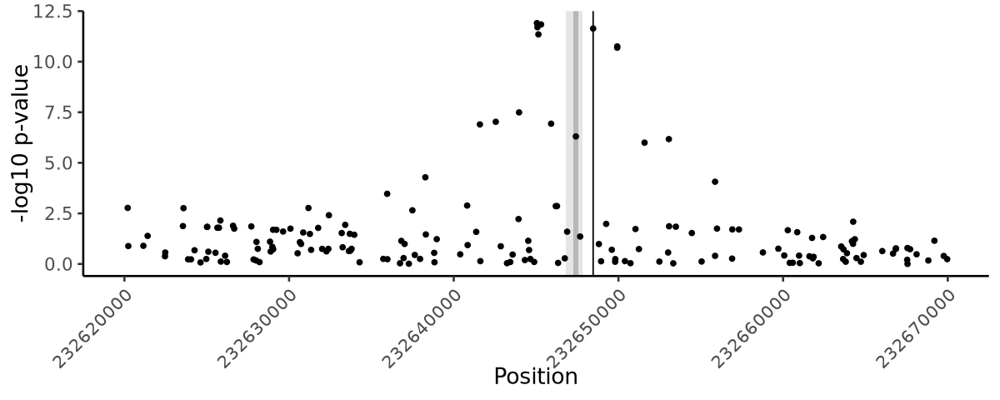

In [391]:
options(repr.plot.width=10, repr.plot.height=4)
p1 <- ggplot(mutate(filter(ALT, chr.hg38 == 2 & pos.hg38 > 231645051 & pos.hg38 < 233645051), 
              cs.snp=RSID %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP), 
      aes(x=pos.hg38, y=-log10(P), color=cs.snp)) + geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="-log10 p-value") +
    xlim(c(232620000,232670000)) + 
    geom_vline(xintercept = 232648465) +
    annotate("rect", xmin = 232647251, xmax = 232647551, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 232646831, xmax = 232647830, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_Locus_Zoom_GWAS_v2.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 3511 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 3511 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

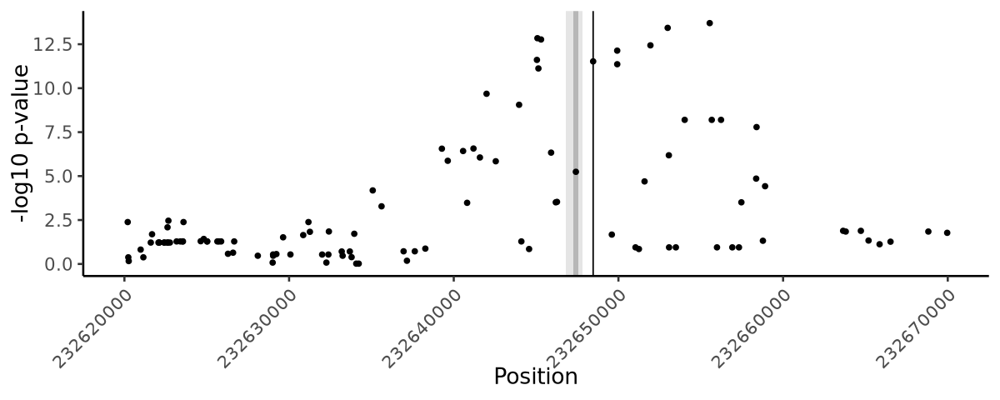

In [392]:
p1 <- ggplot(mutate(EFHD1.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="-log10 p-value")  +
    xlim(c(232620000,232670000)) + 
    geom_vline(xintercept = 232648465) +
    annotate("rect", xmin = 232647251, xmax = 232647551, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 232646831, xmax = 232647830, ymin = -Inf, ymax = Inf, alpha = .1, fill='black')+
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) + 
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_Locus_Zoom_eQTL_v2.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 3465 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 3465 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

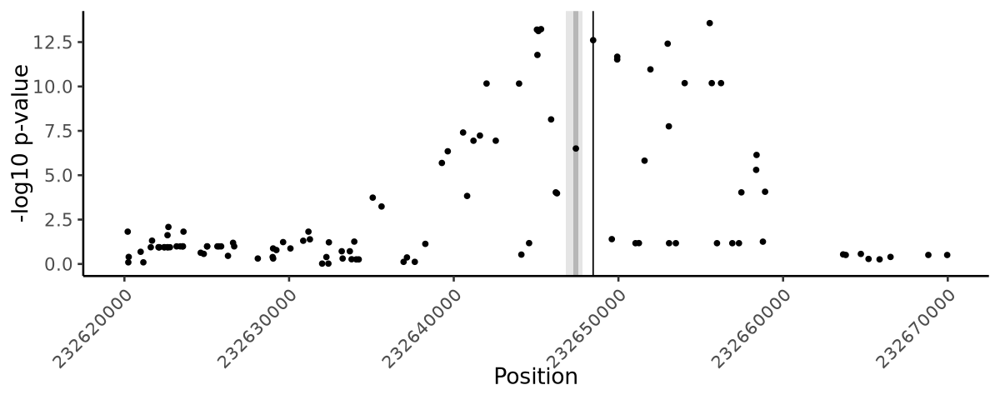

In [393]:
p1 <- ggplot(mutate(ATAC.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="-log10 p-value")   +
    xlim(c(232620000,232670000)) + 
    geom_vline(xintercept = 232648465) +
    annotate("rect", xmin = 232647251, xmax = 232647551, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 232646831, xmax = 232647830, ymin = -Inf, ymax = Inf, alpha = .1, fill='black')+
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_Locus_Zoom_caQTL_v2.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 3467 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 3467 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

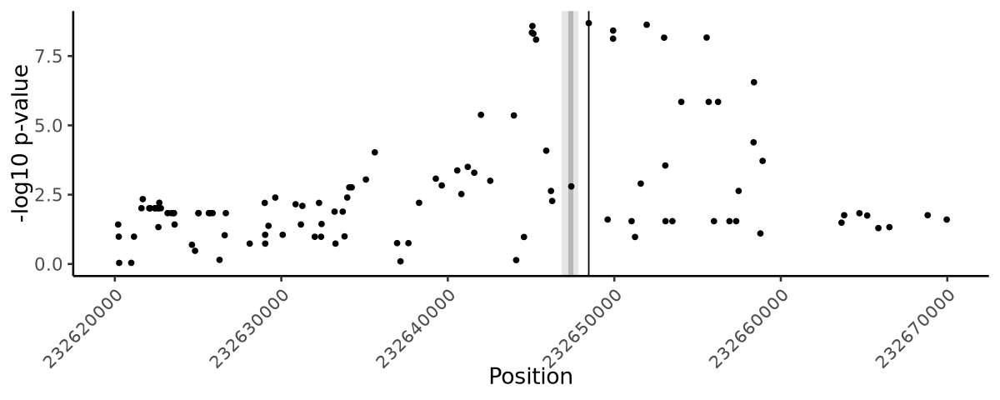

In [394]:
p1 <- ggplot(mutate(H3K27ac.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs7604422')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="-log10 p-value")  +
    xlim(c(232620000,232670000)) + 
    geom_vline(xintercept = 232648465) +
    annotate("rect", xmin = 232647251, xmax = 232647551, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 232646831, xmax = 232647830, ymin = -Inf, ymax = Inf, alpha = .1, fill='black')+
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_Locus_Zoom_H3K27acQTL_v2.pdf', width=10, height=3)
p1
dev.off()

In [27]:
fine.mapping <- read.table('/nfs/lab/projects/nash_nafld_liver/GWAS/MVP_GWAS/NAFLD.EUR.MVP.2021.credset.hg38.tsv', sep='\t', header=T)

dim(fine.mapping)
head(fine.mapping)

[1] 847  19

,CS.Type,LEAD.SNP,CS.SNP,Chr,Position,EA,NEA,EAF,Beta,SE,P,N,PP,Nominated.Gene,Biological.Prior.Gene,Not.in.Trans.Ethnic,chr.hg38,start.hg38,end.hg38
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>
1,Single SNP,rs2642438,rs2642438,1,220970028,A,G,0.295,-0.079,0.0080,8.04e-23,164197,99.54%,MTARC1,MTARC1,,1,220796685,220796686
2,,rs74816838,rs74816838,1,161643560,T,C,0.112,0.087,0.0128,1.09e-11,164197,96.21%,FCGR2A;FCGR2B,FCGR2A;FCGR2B,*,1,161673769,161673770
3,,rs147998249,rs147998249,8,145732180,C,G,0.003,-2.019,0.1230,7.52e-61,164197,100.00%,GPT,GPT,*,8,144506796,144506797
4,,rs2954038,rs2954038,8,126507389,C,A,0.306,0.139,0.0079,2.12e-70,164197,99.99%,lnc-TRIB1-2;WASHC5,TRIB1,,8,125495146,125495147
5,,rs10883451,rs10883451,10,101924418,C,T,0.477,-0.161,0.0073,3.60e-106,164197,98.90%,ERLIN1,ERLIN1,,10,100164660,100164661
6,,rs11601507,rs11601507,11,5701074,A,C,0.073,0.088,0.0139,2.16e-10,164197,99.82%,TRIM5,TRIM5,,11,5679843,5679844


In [17]:
filter(fine.mapping, LEAD.SNP=='rs7604422') 

CS.Type,LEAD.SNP,CS.SNP,Chr,Position,EA,NEA,EAF,Beta,SE,P,N,PP,Nominated.Gene,Biological.Prior.Gene,Not.in.Trans.Ethnic,chr.hg38,start.hg38,end.hg38
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>
,rs7604422,rs7604422,2,233509761,C,A,0.401,-0.053,0.0075,1.24e-12,164197,30.81%,EFHD1,EFHD1,,2,232645050,232645051
,rs7604422,rs11683367,2,233510011,C,T,0.400,-0.053,0.0075,1.45e-12,164197,28.05%,EFHD1,EFHD1,,2,232645300,232645301
,rs7604422,rs2140773,2,233513175,C,A,0.399,-0.052,0.0074,2.29e-12,164197,23.02%,EFHD1,EFHD1,,2,232648464,232648465
,rs7604422,rs11689178,2,233509851,T,C,0.393,-0.052,0.0075,4.46e-12,164197,14.60%,EFHD1,EFHD1,,2,232645140,232645141


In [19]:
filter(coloc.res, gwas.lead=='rs7604422')

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2857,3.147337e-11,4.963771e-09,3.386015e-05,0.004344576,0.9956216,Hepatocytes,ATAC,chr2-232630285-232630522,rs2140773,3.129548e-08,232648465,rs7604422,1.238e-12,232645051,0.988
2852,5.825289e-13,4.502646e-09,6.267048e-07,0.003847952,0.9961514,Hepatocytes,ATAC,chr2-232633359-232633659,rs11683367,2.610760e-09,232645301,rs7604422,1.238e-12,232645051,1.000
2850,6.120780e-14,6.806535e-09,6.584948e-08,0.006329036,0.9936709,Hepatocytes,ATAC,chr2-232634360-232634660,rs11689178,3.808140e-11,232645141,rs7604422,1.238e-12,232645051,0.956
2850,1.141901e-14,6.057141e-09,1.228497e-08,0.005522005,0.9944780,Hepatocytes,ATAC,chr2-232634838-232635138,rs11689178,1.529645e-11,232645141,rs7604422,1.238e-12,232645051,0.956
2837,5.718959e-18,4.638630e-09,6.152655e-12,0.003994393,0.9960056,Hepatocytes,ATAC,chr2-232642898-232643198,rs11683367,2.664041e-13,232645301,rs7604422,1.238e-12,232645051,1.000
2837,1.678744e-20,4.269696e-09,1.806052e-14,0.003597085,0.9964029,Hepatocytes,ATAC,chr2-232647213-232647513,rs11683367,9.836419e-14,232645301,rs7604422,1.238e-12,232645051,1.000
2832,7.843163e-38,3.948455e-09,8.437947e-32,0.003251136,0.9967489,Hepatocytes,ATAC,chr2-232655472-232655697,rs7604422,3.790168e-19,232645051,rs7604422,1.238e-12,232645051,1.000
2836,4.607006e-22,4.572983e-09,4.956377e-16,0.003923697,0.9960763,Hepatocytes,ATAC,chr2-232658271-232658571,rs2140773,6.769846e-15,232648465,rs7604422,1.238e-12,232645051,0.988
2838,5.517444e-14,4.368508e-09,5.935858e-08,0.003703496,0.9962964,Hepatocytes,ATAC,chr2-232667947-232668247,rs11683367,1.109020e-10,232645301,rs7604422,1.238e-12,232645051,1.000


### mashr plots

In [147]:
eQTL.post.mean <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/241125_WE_lead_post_mean.tsv')
eQTL.post.sd <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/241125_WE_lead_post_sd.tsv')
eQTL.post.lfsr <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/241125_WE_lead_lfsr.tsv')

dim(eQTL.post.mean)
head(eQTL.post.mean)

dim(eQTL.post.sd)
head(eQTL.post.sd)

dim(eQTL.post.lfsr)
head(eQTL.post.lfsr)

[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SSU72:rs2453567,-0.0012997757,0.025609183,0.4143870200,0.013356947,0.032406778,0.0168504327,-0.0082455214,-0.0006958149
PRKCZ:rs12410859,0.0227966136,0.006442856,-0.0217524554,0.037401669,0.034388914,0.5444316264,0.0428712239,0.0228157635
CEP104:rs6663840,-0.1576235189,-0.301300512,-0.0611611623,-0.541462849,-0.207071253,-0.3863292855,-0.1556096166,-0.1025297568
NPHP4:rs806111,0.0006059812,0.001067541,0.0005847327,1.187756248,0.000829102,-0.0001434166,0.0007824627,0.0007950057
EYA3:rs6598888,0.0063871256,0.007896643,0.0137134210,-0.005815692,0.007365192,1.0051111493,0.0061060669,0.0035128290
EYA3:rs12139137,-0.0118302112,-0.122940288,0.1292275796,-0.442353781,-0.030528988,0.2661668037,-0.0485270595,-0.0552536085


[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SSU72:rs2453567,0.04412065,0.06217044,0.12435131,0.05489708,0.07464919,0.06552481,0.05153134,0.04934452
PRKCZ:rs12410859,0.06362100,0.06402498,0.08048142,0.08400189,0.07780245,0.14014254,0.08466795,0.07098945
CEP104:rs6663840,0.08590291,0.09856903,0.10483251,0.07735445,0.09277002,0.10584682,0.09566203,0.10254403
NPHP4:rs806111,0.01151286,0.01772324,0.01266418,0.09465215,0.01477458,0.01002401,0.01715258,0.01757172
EYA3:rs6598888,0.04229136,0.05218719,0.07122888,0.04924212,0.05091227,0.18166604,0.04044153,0.04562638
EYA3:rs12139137,0.08259649,0.10504705,0.10756615,0.09872829,0.10110893,0.12111416,0.08384824,0.10119202


[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SSU72:rs2453567,0.85606196,0.7564693130,0.002059214,8.044823e-01,0.75109479,8.000281e-01,0.82743669,0.8554969
PRKCZ:rs12410859,0.74124829,0.8037397920,0.771105147,7.206494e-01,0.72054650,6.924803e-04,0.69942062,0.7531656
CEP104:rs6663840,0.02838375,0.0006151098,0.279442236,3.142286e-11,0.01481013,1.016553e-04,0.05156686,0.1534803
NPHP4:rs806111,0.99539618,0.9950323482,0.995736691,3.178123e-31,0.99523688,9.969058e-01,0.99559178,0.9956309
EYA3:rs6598888,0.95500011,0.9555617176,0.950026180,9.607890e-01,0.95646387,4.407864e-05,0.95602096,0.9626096
EYA3:rs12139137,0.44891117,0.1296896460,0.125986873,6.422787e-05,0.39114895,2.882506e-02,0.29221765,0.3030239


pdf 
  2

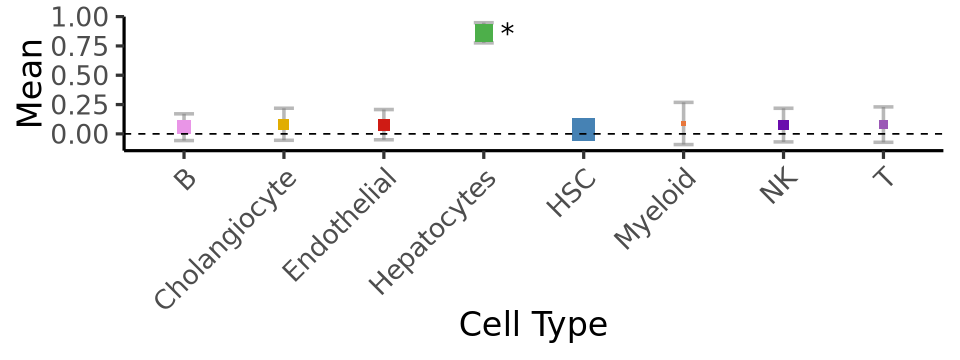

In [338]:
options(repr.plot.width=8, repr.plot.height=3)

p1 <- data.frame(mean=unlist(eQTL.post.mean[str_detect(rownames(eQTL.post.mean), 'EFHD1'),]), 
          sd=unlist(eQTL.post.sd[str_detect(rownames(eQTL.post.sd), 'EFHD1'),]),
          ct=colnames(eQTL.post.mean),
          lfsr=unlist(eQTL.post.lfsr[str_detect(rownames(eQTL.post.lfsr), 'EFHD1'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(size=(1/(sd*sd)), color=ct),  shape = 15) +
        theme_classic(base_size=20) +
        labs(x='Mean', y='Cell Type') +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        coord_flip() + geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_eQTL_EFHD1.pdf', width=8, height=3)
p1
dev.off()

In [12]:
caQTL.post.mean <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/mashr/241125_WE_lead_post_mean.tsv')
caQTL.post.sd <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/mashr/241125_WE_lead_post_sd.tsv')
caQTL.post.lfsr <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/mashr/241125_WE_lead_lfsr.tsv')

dim(caQTL.post.mean)
head(caQTL.post.mean)

dim(caQTL.post.sd)
head(caQTL.post.sd)

dim(caQTL.post.lfsr)
head(caQTL.post.lfsr)

[1] 10198     8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1-1692642-1692942:rs6695303,-0.3929466,-0.4963367,-0.5283980,-0.6045352,-0.4984533,-0.5305598,-0.4261615,-0.4603527
chr1-1692642-1692942:rs1062090,-0.4727073,-0.6301461,-0.7612219,-0.7111082,-0.6814532,-0.7015417,-0.5182721,-0.5636612
chr1-1746281-1746581:rs6695303,0.4253963,0.6963871,0.6974603,0.7810967,0.7863518,0.8306667,0.5297301,0.5903259
chr1-1890996-1891296:rs6603802,0.1539943,0.2972196,0.4836570,0.5140178,0.3367306,0.2704756,0.1839083,0.2365852
chr1-1891323-1891623:rs61422524,0.3778319,0.6972030,0.9027682,1.0316971,0.7471005,0.9011340,0.4317730,0.6069157
chr1-1891323-1891623:rs915292,0.4185139,0.7671672,0.9885093,1.0796467,0.8641216,1.0300346,0.4829224,0.6781024


[1] 10198     8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1-1692642-1692942:rs6695303,0.14174791,0.06961061,0.07963628,0.12160337,0.07910549,0.08134829,0.11287491,0.08701615
chr1-1692642-1692942:rs1062090,0.17643916,0.07892272,0.12315065,0.10607884,0.08733635,0.09774527,0.14190616,0.11044428
chr1-1746281-1746581:rs6695303,0.17084716,0.08027644,0.10273570,0.11068629,0.10818976,0.12859671,0.12034374,0.09857593
chr1-1890996-1891296:rs6603802,0.04945064,0.06889056,0.07734756,0.06708438,0.07844700,0.09292540,0.05419240,0.06068058
chr1-1891323-1891623:rs61422524,0.05845472,0.07083961,0.08293042,0.07536927,0.09088493,0.08946831,0.06140205,0.06081457
chr1-1891323-1891623:rs915292,0.05872161,0.07324383,0.07840954,0.07182307,0.08814689,0.07613048,0.06192945,0.05881448


[1] 10198     8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1-1692642-1692942:rs6695303,4.998708e-06,2.769574e-09,7.885468e-08,8.744561e-12,5.206649e-07,1.001646e-07,2.852537e-07,1.302514e-08
chr1-1692642-1692942:rs1062090,8.072153e-08,1.120104e-12,5.662137e-15,2.563126e-10,1.121625e-11,4.843381e-11,5.143097e-09,1.747171e-10
chr1-1746281-1746581:rs6695303,1.490714e-07,7.068595e-16,4.572129e-10,1.015848e-12,6.875915e-14,4.288554e-13,5.984611e-12,5.839702e-13
chr1-1890996-1891296:rs6603802,1.592476e-03,4.187899e-05,6.813244e-11,3.998245e-15,2.460050e-05,2.799131e-03,8.876283e-04,1.014163e-04
chr1-1891323-1891623:rs61422524,5.135247e-11,3.795786e-23,6.808187e-28,5.738074e-43,1.026215e-16,3.699745e-24,1.036820e-12,8.687290e-24
chr1-1891323-1891623:rs915292,5.125210e-13,5.695672e-26,9.679670e-37,2.257430e-51,5.453405e-23,5.212239e-42,3.151159e-15,4.616332e-31


pdf 
  2

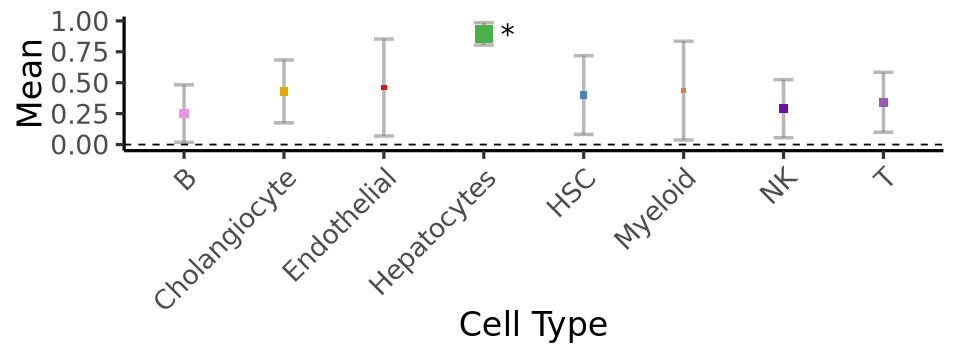

In [339]:
options(repr.plot.width=8, repr.plot.height=3)

p1 <- data.frame(mean=unlist(caQTL.post.mean[str_detect(rownames(caQTL.post.mean), 'chr2-232647251-232647551'),]), 
          sd=unlist(caQTL.post.sd[str_detect(rownames(caQTL.post.sd), 'chr2-232647251-232647551'),]),
          ct=colnames(caQTL.post.mean),
          lfsr=unlist(caQTL.post.lfsr[str_detect(rownames(caQTL.post.lfsr), 'chr2-232647251-232647551'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(size=(1/(sd*sd)), color=ct),  shape = 15) +
        theme_classic(base_size=20) +
        labs(x='Mean', y='Cell Type') +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        coord_flip() + geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_caQTL_EFHD1.pdf', width=8, height=3)
p1
dev.off()

In [178]:
H3K27acQTL.post.mean <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/241125_WE_lead_post_mean.tsv')
H3K27acQTL.post.sd <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/241125_WE_lead_post_sd.tsv')
H3K27acQTL.post.lfsr <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/241125_WE_lead_lfsr.tsv')

dim(H3K27acQTL.post.mean)
head(H3K27acQTL.post.mean)

dim(H3K27acQTL.post.sd)
head(H3K27acQTL.post.sd)

dim(H3K27acQTL.post.lfsr)
head(H3K27acQTL.post.lfsr)

[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,-0.1338823,-0.08025867,-0.07815151,-0.3042827,-0.04651485,-0.5953661,-0.04202872,-0.08958440
chr2:8583413-8584412:rs6725518,-0.0479803,-0.32033146,-0.31363206,-0.7362798,-0.15303094,-0.2076617,-0.05610962,-0.07499506
chr3:42489939-42490938:rs435698,0.3244780,0.34289691,0.70908480,0.3995993,0.40361578,0.7507474,0.17345987,0.29739741
chr6:29887928-29888927:rs3928943,-0.2933307,-0.68053534,-0.87967897,-1.0656060,-0.52087772,-0.7885956,-0.22472228,-0.37144639
chr6:29926679-29927678:rs2523972,0.1885049,0.39375523,0.53350418,0.7462293,0.26200666,0.4017252,0.11935811,0.20150497
chr8:8227666-8228665:rs11250200,-0.4599420,-0.73018228,-1.01068046,-0.9927619,-0.68108841,-1.0068800,-0.34809687,-0.50255528


[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,0.11425219,0.10699715,0.1362916,0.2427062,0.09006031,0.10941588,0.08619415,0.09352464
chr2:8583413-8584412:rs6725518,0.07371075,0.08804418,0.1208606,0.1134952,0.10050033,0.10837388,0.08158693,0.07943640
chr3:42489939-42490938:rs435698,0.09080684,0.11051166,0.2224582,0.1405502,0.12760786,0.14105537,0.13094309,0.12347124
chr6:29887928-29888927:rs3928943,0.09768325,0.11608521,0.1637505,0.1363839,0.11268928,0.14627664,0.09802858,0.09740995
chr6:29926679-29927678:rs2523972,0.07301573,0.09038749,0.1172122,0.1098970,0.08810552,0.10472259,0.07137239,0.07717374
chr8:8227666-8228665:rs11250200,0.08348800,0.09995709,0.1056314,0.1016016,0.08726351,0.08908726,0.09281300,0.09054074


[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01
chr2:8583413-8584412:rs6725518,2.551857e-01,1.421604e-03,5.654929e-03,5.365863e-08,6.391894e-02,2.914033e-02,2.429701e-01,1.715597e-01
chr3:42489939-42490938:rs435698,5.576562e-04,1.367735e-03,9.305303e-04,3.565958e-03,1.475027e-03,2.191046e-10,5.984101e-02,6.511540e-03
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09


pdf 
  2

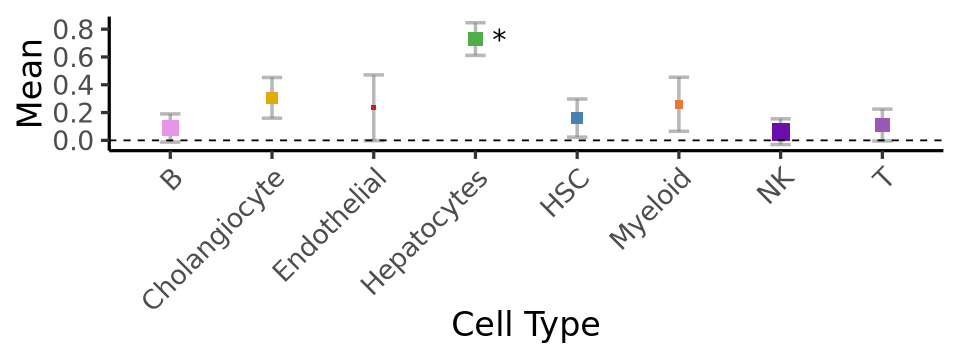

In [340]:
options(repr.plot.width=8, repr.plot.height=3)

p1 <- data.frame(mean=unlist(H3K27acQTL.post.mean[str_detect(rownames(H3K27acQTL.post.mean), 'chr2:232646831-232647830'),]), 
          sd=unlist(H3K27acQTL.post.sd[str_detect(rownames(H3K27acQTL.post.sd), 'chr2:232646831-232647830'),]),
          ct=colnames(H3K27acQTL.post.mean),
          lfsr=unlist(H3K27acQTL.post.lfsr[str_detect(rownames(H3K27acQTL.post.lfsr), 'chr2:232646831-232647830'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(size=(1/(sd*sd)), color=ct),  shape = 15) +
        theme_classic(base_size=20) +
        labs(x='Mean', y='Cell Type') +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        coord_flip() + geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_H3K27acQTL_EFHD1.pdf', width=8, height=3)
p1
dev.off()

In [425]:
qtl.boxplot.flip <- function(feature, snp, genotypes, count.mats, colors, unit='CPM', ylims=NULL) {
    snp.geno <- filter(genotypes, ID==snp) %>% select(-ID)
    snp.geno <- snp.geno[1,]
    snp.info <- rownames(snp.geno)
    
    ref <- str_split(snp.info, ":", simplify=T)[3]
    alt <- str_split(snp.info, ":", simplify=T)[4]
    rownames(snp.geno) <- 'Genotypes'
    
    feat.counts <- data.frame()
    for (cell in names(count.mats)) {
        feat.counts <- rbind(feat.counts,count.mats[[cell]][feature,colnames(snp.geno)])
    }
    rownames(feat.counts) <- names(count.mats)
    
    plot.data <- data.frame(t(rbind(feat.counts, snp.geno)))
    #colnames(plot.data) <- c('Feature','Genotype')
    
    plot.data$geno <- paste0(ref,ref)
    plot.data$geno[plot.data$Genotype == 1] <- paste0(ref,alt)
    plot.data$geno[plot.data$Genotype == 2] <- paste0(alt,alt)
    plot.data <- tidyr::pivot_longer(plot.data, cols = all_of(names(TPM)), values_to = 'Feature', names_to = 'cell')
    
    p1 <- ggplot(plot.data, aes(x=interaction(geno, cell), y=Feature, fill=cell)) + 
        geom_boxplot(outlier.shape = NA) + 
        geom_jitter(width=.2, alpha=.5) +
        labs(y=paste0(feature, " (", unit, ')'), x='Genotype') +
        theme_classic(base_size=20) +
        scale_fill_manual(values=colors) + 
        scale_x_discrete(labels = function(x) gsub("\\..*", "", x)) + 
                         coord_flip() + theme(legend.position='none')
                         
    if(!is.null(ylims)) {
        p1 <- p1 + ylim(ylims)
    }
    print(p1)
}

In [433]:
options(repr.plot.width=4, repr.plot.height=10)

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_eQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('EFHD1','rs7604422', vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_caQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('chr2-232647251-232647551','rs7604422', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM', ylims=c(0,18))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_EFHD1_H3K27acQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('chr2:232646831-232647830','rs7604422', vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
dev.off()

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 117 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 156 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

pdf 
  2

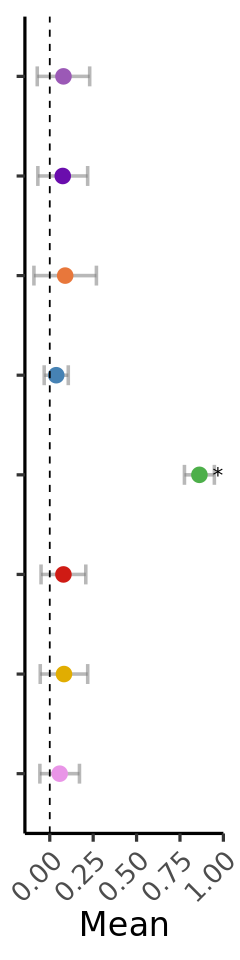

In [432]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(eQTL.post.mean[str_detect(rownames(eQTL.post.mean), 'EFHD1'),]), 
          sd=unlist(eQTL.post.sd[str_detect(rownames(eQTL.post.sd), 'EFHD1'),]),
          ct=colnames(eQTL.post.mean),
          lfsr=unlist(eQTL.post.lfsr[str_detect(rownames(eQTL.post.lfsr), 'EFHD1'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_eQTL_EFHD1_v2.pdf', width=2, height=8)
p1
dev.off()

pdf 
  2

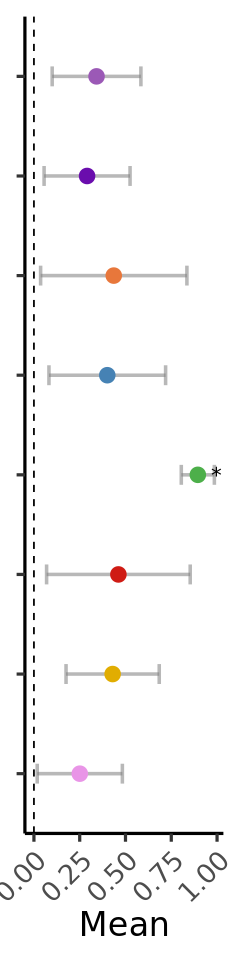

In [430]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(caQTL.post.mean[str_detect(rownames(caQTL.post.mean), 'chr2-232647251-232647551'),]), 
          sd=unlist(caQTL.post.sd[str_detect(rownames(caQTL.post.sd), 'chr2-232647251-232647551'),]),
          ct=colnames(caQTL.post.mean),
          lfsr=unlist(caQTL.post.lfsr[str_detect(rownames(caQTL.post.lfsr), 'chr2-232647251-232647551'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_caQTL_EFHD1_v2.pdf', width=2, height=8)
p1
dev.off()

pdf 
  2

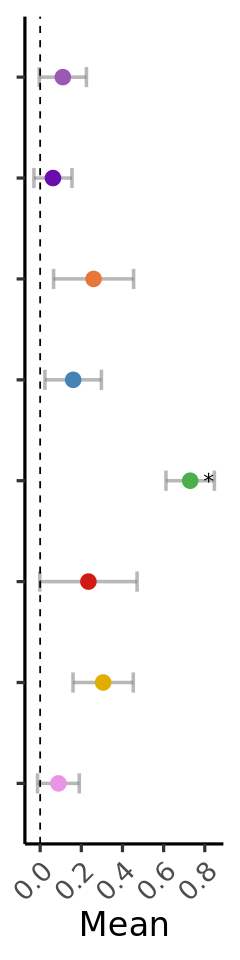

In [431]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(H3K27acQTL.post.mean[str_detect(rownames(H3K27acQTL.post.mean), 'chr2:232646831-232647830'),]), 
          sd=unlist(H3K27acQTL.post.sd[str_detect(rownames(H3K27acQTL.post.sd), 'chr2:232646831-232647830'),]),
          ct=colnames(H3K27acQTL.post.mean),
          lfsr=unlist(H3K27acQTL.post.lfsr[str_detect(rownames(H3K27acQTL.post.lfsr), 'chr2:232646831-232647830'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_H3K27acQTL_EFHD1_v2.pdf', width=2, height=8)
p1
dev.off()

# QTL Example Using HiC

In [210]:
coloc.res

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2866,7.785105e-09,5.311408e-04,1.782465e-06,0.120730410,0.8787367,Hepatocytes,ATAC,chr1-16179136-16179436,rs6656611,6.831334e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2832,7.832685e-07,3.756671e-04,1.793359e-04,0.085097785,0.9143464,Hepatocytes,ATAC,chr1-16189049-16189288,rs6656611,3.613621e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2825,4.295586e-14,2.657291e-04,9.835105e-12,0.059901085,0.9398332,Hepatocytes,ATAC,chr1-16189980-16190280,rs6690317,2.161590e-13,16190090,rs1497406,1.458e-08,16178825,0.823
2439,4.226498e-35,2.134257e-11,3.782529e-26,0.018118780,0.9818812,Hepatocytes,ATAC,chr11-61820741-61821041,rs174536,1.015739e-17,61784455,rs174535,3.105e-15,61783884,0.978
3137,6.809861e-28,1.723499e-26,6.380127e-04,0.015163181,0.9841988,Hepatocytes,ATAC,chr11-94132939-94133200,rs11607757,1.160876e-08,94132981,rs7117339,2.256e-30,94137172,1.000
3759,1.174897e-33,8.672100e-09,2.153630e-26,0.158120960,0.8418790,Hepatocytes,ATAC,chr12-52884847-52885147,rs4919766,5.638330e-18,52873026,rs4919741,1.721e-13,52879136,0.899
3412,6.073097e-09,5.677144e-05,4.623425e-07,0.003325370,0.9966174,Hepatocytes,ATAC,chr14-24402430-24402730,rs11621792,4.463059e-10,24402720,rs11621792,1.114e-08,24402720,1.000
3192,1.294632e-30,1.454103e-05,2.214677e-27,0.023898695,0.9760868,Hepatocytes,ATAC,chr15-89803942-89804242,rs72754570,5.933149e-19,89805748,rs72754571,2.467e-09,89807657,0.862
2691,2.604753e-07,2.112140e-04,2.420459e-04,0.195465879,0.8040806,Hepatocytes,ATAC,chr19-4327651-4327951,rs4435380,1.567333e-10,4335872,rs3810367,3.505e-09,4342850,0.826


In [212]:
sort(unique(coloc.res$feature))

KRT8: 
58297029 - body
52905156 - start - 20009
chr12-52884847-52885147 -  (KRT8 - 20009), 52849087 (KRT78 - 35760) # GRN to KRT8 via RAD21_direct_+/-
chr12:52884454-52885453

chr1-16179136-16179436 - 16155923 (EPHA2 - 23213), 16206650 (ARHGEF19 - 27214)

chr11-61820741-61821041 - Right at the front of FADS1 or FADS2 #GRN to FADS2, FADS3, MYRF, DAGLA

chr8-10713844-10714144 - 1kb to RP1L1

chr8-9325934-9326177 - At promotor of what I think is a lncRNA

[1] "AC021242.2"               "AC021736.1"              
 [3] "AC022784.1"               "CHEK2"                   
 [5] "chr1-16179136-16179436"   "chr1-16189049-16189288"  
 [7] "chr1-16189980-16190280"   "chr11-61820741-61821041" 
 [9] "chr11-94132939-94133200"  "chr12-52884847-52885147" 
[11] "chr12:52884454-52885453"  "chr14-24402430-24402730" 
[13] "chr14:24401916-24402915"  "chr15-89803942-89804242" 
[15] "chr19-4327651-4327951"    "chr2-232625035-232625335"
[17] "chr2-232630358-232630573" "chr2-232633413-232633713"
[19] "chr2-232634877-232635116" "chr2-232636795-232637095"
[21] "chr2-232642905-232643205" "chr2-232647251-232647551"
[23] "chr2-232649192-232649393" "chr2-232651647-232651947"
[25] "chr2-232652993-232653226" "chr2-232654724-232655024"
[27] "chr2-232655454-232655754" "chr2-232657158-232657458"
[29] "chr2-232658238-232658500" "chr2-232667147-232667436"
[31] "chr2-232668019-232668319" "chr2-232669144-232669444"
[33] "chr2-232670328-232670628" "chr2-232672658-232672958"
[35] "chr2-232684797-232685097" "chr2:232634449-232635448"
[37] "chr2:232642518-232643517" "chr2:232646831-232647830"
[39] "chr2:232651359-232652358" "chr2:232655093-232656092"
[41] "chr2:232656697-232657696" "chr22-28708746-28709014" 
[43] "chr22-28710094-28710394"  "chr22-28710544-28710844" 
[45] "chr22-28712079-28712379"  "chr22-28732755-28733032" 
[47] "chr22-28733791-28734091"  "chr8-10713844-10714144"  
[49] "chr8-9325934-9326177"     "chr9-114387910-114388210"
[51] "EFHD1"                    "EPHA2"                   
[53] "HSD17B13"

In [239]:
filter(grn.direct, str_detect(Region, 'chr12:5288'))
filter(grn.extended, str_detect(Region, 'chr12:5288'))

#filter(grn.direct, str_detect(Region, 'chr11:6182'))
#filter(grn.extended, str_detect(Region, 'chr11:6182'))

Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>
chr12:52884847-52885147,KRT8,0.003036954,-0.07773844,-0.0002360881,0.0002360881,RAD21,False,RAD21_direct_+/-,RAD21_direct_+/-_(53g),RAD21_direct_+/-_(83r),2.253775,1,0.1045922,12519


Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>


In [215]:
ct.abc <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/03_ABC/FNIH_liver_celltype_abc_links.txt', header=T)
disease.abc <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/03_ABC/FNIH_liver_disease_abc_links.txt', header=T)

dim(ct.abc)
head(ct.abc)

dim(disease.abc)
head(disease.abc)

[1] 50156    11

,chrom1,start1,end1,chrom2,start2,end2,peak,gene,pair,celltype,abc_score
,<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,chr1,100352254,100352554,chr1,101236527,101236528,chr1:100352254-100352554,AL109741.1,genic|chr1:100352254-100352554,B,0.020619
2,chr1,101237928,101238228,chr1,101236527,101236528,chr1:101237928-101238228,AL109741.1,genic|chr1:101237928-101238228,B,0.057743
3,chr1,101238744,101239044,chr1,101236527,101236528,chr1:101238744-101239044,AL109741.1,genic|chr1:101238744-101239044,B,0.044911
4,chr1,101247912,101248212,chr1,101236527,101236528,chr1:101247912-101248212,AL109741.1,intergenic|chr1:101247912-101248212,B,0.030475
5,chr1,101258017,101258317,chr1,101236527,101236528,chr1:101258017-101258317,AL109741.1,intergenic|chr1:101258017-101258317,B,0.020040
6,chr1,1032988,1033288,chr1,3857213,3857214,chr1:1032988-1033288,CEP104,genic|chr1:1032988-1033288,B,0.026496


[1] 248658     11

,chrom1,start1,end1,chrom2,start2,end2,peak,gene,pair,celltype,abc_score
,<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,chr1,100351219,100351519,chr1,101236865,101236866,chr1:100351219-100351519,S1PR1,genic|chr1:100351219-100351519,B_Control,0.025956
2,chr1,100351219,100351519,chr1,101236527,101236528,chr1:100351219-100351519,AL109741.1,genic|chr1:100351219-100351519,B_Control,0.025955
3,chr1,100351529,100351829,chr1,101236527,101236528,chr1:100351529-100351829,AL109741.1,genic|chr1:100351529-100351829,B_Control,0.029199
4,chr1,100351529,100351829,chr1,101236865,101236866,chr1:100351529-100351829,S1PR1,genic|chr1:100351529-100351829,B_Control,0.029200
5,chr1,100352254,100352554,chr1,101236527,101236528,chr1:100352254-100352554,AL109741.1,genic|chr1:100352254-100352554,B_Control,0.032444
6,chr1,100352254,100352554,chr1,101236865,101236866,chr1:100352254-100352554,S1PR1,genic|chr1:100352254-100352554,B_Control,0.032445


In [218]:
filter(ct.abc, chrom1=='chr12' & end1 < 52900000 & start1 > 52700000)
filter(disease.abc, chrom1=='chr12' & end1 < 52900000 & start1 > 52700000)

chrom1,start1,end1,chrom2,start2,end2,peak,gene,pair,celltype,abc_score
<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>


chrom1,start1,end1,chrom2,start2,end2,peak,gene,pair,celltype,abc_score
<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
chr12,52867642,52867942,chr12,52006946,52006947,chr12:52867642-52867942,GRASP,intergenic|chr12:52867642-52867942,Mast_MASH,0.024003
chr12,52867642,52867942,chr12,52022832,52022833,chr12:52867642-52867942,NR4A1,intergenic|chr12:52867642-52867942,Mast_MASH,0.028285
chr12,52707987,52708287,chr12,52680406,52680407,chr12:52707987-52708287,KRT1,intergenic|chr12:52707987-52708287,Mast_MASL,0.048806
chr12,52874268,52874568,chr12,54280132,54280133,chr12:52874268-52874568,CBX5,intergenic|chr12:52874268-52874568,Schwann_MetALD,0.020673
chr12,52874268,52874568,chr12,52022832,52022833,chr12:52874268-52874568,NR4A1,intergenic|chr12:52874268-52874568,Schwann_MetALD,0.028957
chr12,52874268,52874568,chr12,51848223,51848224,chr12:52874268-52874568,FIGNL2-DT,intergenic|chr12:52874268-52874568,Schwann_MetALD,0.025192
chr12,52874268,52874568,chr12,54280193,54280194,chr12:52874268-52874568,HNRNPA1,intergenic|chr12:52874268-52874568,Schwann_MetALD,0.020673
chr12,52874268,52874568,chr12,53727744,53727745,chr12:52874268-52874568,CALCOCO1,intergenic|chr12:52874268-52874568,Schwann_MetALD,0.021116


In [220]:
grn.direct <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/SCENIC/Hepatocytes/eRegulon_direct.tsv', header=T)

dim(grn.direct)
head(grn.direct)

[1] 35155    15

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>
1,chr4:73965001-73965301,CXCL2,0.02447437,0.12776317,0.003126923,0.003126923,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),1.7770506,1,0.19948248,15869
2,chr3:189383753-189384053,TPRG1,0.01759522,0.10194220,0.001793696,0.001793696,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),3.2928309,1,0.38799972,3467
3,chr16:30844748-30845048,ORAI3,0.10015906,0.05560605,0.005569450,0.005569450,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),1.2935095,1,0.07809416,11437
4,chr8:26693755-26694055,ADRA1A,0.02128050,0.25861542,0.005503467,0.005503467,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),3.0368573,1,0.38357860,2867
5,chr4:68963470-68963770,UGT2B7,0.09891115,0.16103632,0.015928288,0.015928288,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),2.5326155,1,0.18274981,1052
6,chrX:53086539-53086808,KANTR,0.19290936,0.08702135,0.016787234,0.016787234,AR,False,AR_direct_+/+,AR_direct_+/+_(47g),AR_direct_+/+_(54r),0.7767084,1,0.19450613,222


In [224]:
grn.extended <- read.table('/nfs/lab/tscc/welison/FNIH.Liver/SCENIC/Hepatocytes/eRegulons_extended.tsv', header=T)

dim(grn.extended)
head(grn.extended)

[1] 15754    15

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>
1,chr11:65833721-65834021,MUS81,0.07623649,0.06338388,0.004832165,0.004832165,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),2.0086139,1,0.05767172,4857
2,chr11:116835912-116836212,APOC3,0.01733047,0.14044362,0.002433955,0.002433955,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),2.4410678,1,0.19554050,4991
3,chr12:102964936-102965236,ASCL1,0.16835898,0.25297956,0.042591380,0.042591380,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),1.1701618,1,0.08101416,1425
4,chr17:81891523-81891823,DCXR,0.01730347,0.08562343,0.001481582,0.001481582,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),6.3442337,1,0.15593258,1735
5,chr19:1671982-1672282,UQCR11,0.02159165,0.06303429,0.001361014,0.001361014,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),0.9978278,1,0.07912867,13749
6,chr11:116707326-116707626,APOA1,0.02420057,0.17193415,0.004160904,0.004160904,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(24g),ACAA1_extended_+/+_(25r),2.8990847,1,0.14803111,5174


In [225]:
filter(grn.direct, Region=='chr12:52884847-52885147')
filter(grn.extended, Region=='chr12:52884847-52885147')

Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>
chr12:52884847-52885147,KRT8,0.003036954,-0.07773844,-0.0002360881,0.0002360881,RAD21,False,RAD21_direct_+/-,RAD21_direct_+/-_(53g),RAD21_direct_+/-_(83r),2.253775,1,0.1045922,12519


Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>


In [240]:
coloc.res

nsnps,PP.H0.abf,PP.H1.abf,PP.H2.abf,PP.H3.abf,PP.H4.abf,cell,modality,feature,qtl.lead,qtl.pval,qtl.pos,gwas.lead,gwas.pval,qtl.pos.1,r2
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>
2866,7.785105e-09,5.311408e-04,1.782465e-06,0.120730410,0.8787367,Hepatocytes,ATAC,chr1-16179136-16179436,rs6656611,6.831334e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2832,7.832685e-07,3.756671e-04,1.793359e-04,0.085097785,0.9143464,Hepatocytes,ATAC,chr1-16189049-16189288,rs6656611,3.613621e-09,16189310,rs1497406,1.458e-08,16178825,0.823
2825,4.295586e-14,2.657291e-04,9.835105e-12,0.059901085,0.9398332,Hepatocytes,ATAC,chr1-16189980-16190280,rs6690317,2.161590e-13,16190090,rs1497406,1.458e-08,16178825,0.823
2439,4.226498e-35,2.134257e-11,3.782529e-26,0.018118780,0.9818812,Hepatocytes,ATAC,chr11-61820741-61821041,rs174536,1.015739e-17,61784455,rs174535,3.105e-15,61783884,0.978
3137,6.809861e-28,1.723499e-26,6.380127e-04,0.015163181,0.9841988,Hepatocytes,ATAC,chr11-94132939-94133200,rs11607757,1.160876e-08,94132981,rs7117339,2.256e-30,94137172,1.000
3759,1.174897e-33,8.672100e-09,2.153630e-26,0.158120960,0.8418790,Hepatocytes,ATAC,chr12-52884847-52885147,rs4919766,5.638330e-18,52873026,rs4919741,1.721e-13,52879136,0.899
3412,6.073097e-09,5.677144e-05,4.623425e-07,0.003325370,0.9966174,Hepatocytes,ATAC,chr14-24402430-24402730,rs11621792,4.463059e-10,24402720,rs11621792,1.114e-08,24402720,1.000
3192,1.294632e-30,1.454103e-05,2.214677e-27,0.023898695,0.9760868,Hepatocytes,ATAC,chr15-89803942-89804242,rs72754570,5.933149e-19,89805748,rs72754571,2.467e-09,89807657,0.862
2691,2.604753e-07,2.112140e-04,2.420459e-04,0.195465879,0.8040806,Hepatocytes,ATAC,chr19-4327651-4327951,rs4435380,1.567333e-10,4335872,rs3810367,3.505e-09,4342850,0.826


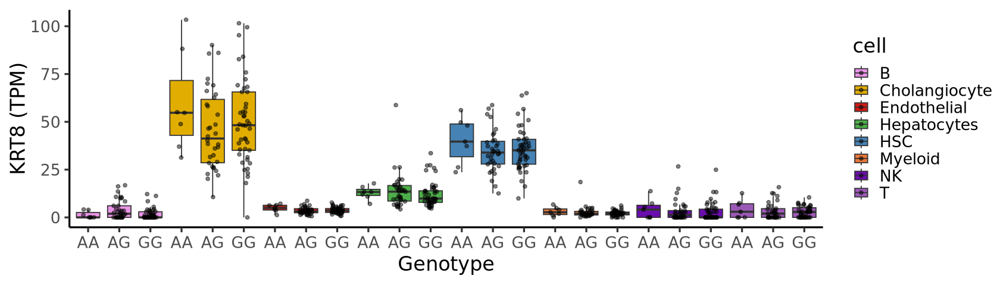

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


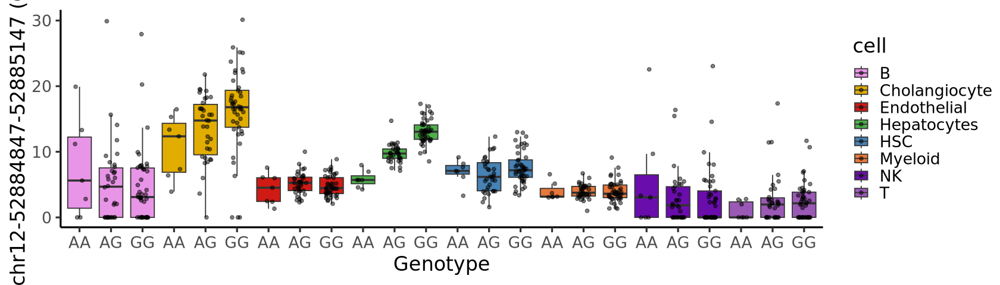

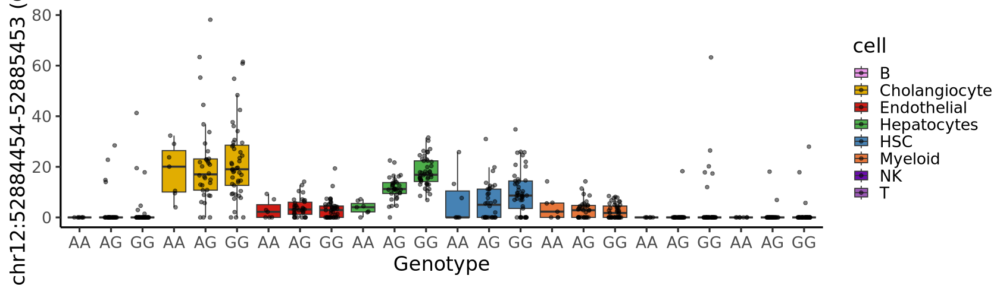

In [308]:
options(repr.plot.width=14, repr.plot.height=4)

#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_eQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('KRT8','rs4919741', vcf.df, 
                TPM, celltype_colors, 'TPM')
#dev.off()
#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_caQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('chr12-52884847-52885147','rs4919741', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM')
#dev.off()
#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_H3K27acQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('chr12:52884454-52885453','rs4919741', vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
#dev.off()

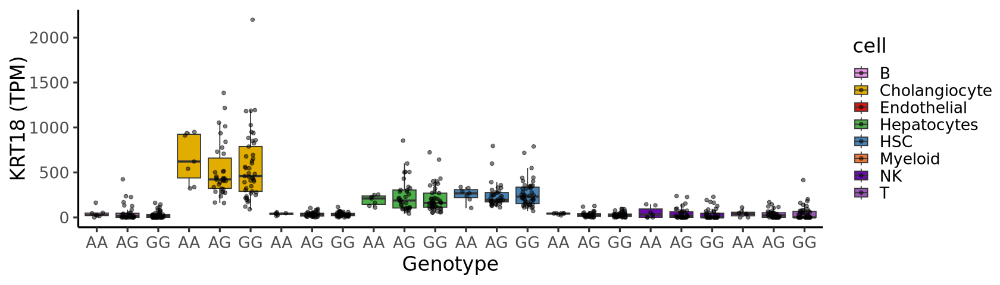

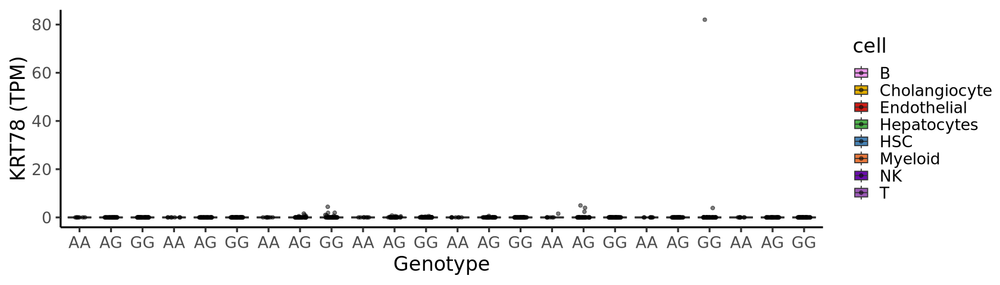

In [244]:
options(repr.plot.width=14, repr.plot.height=4)

qtl.boxplot('KRT18','rs4919741', vcf.df, 
                TPM, celltype_colors, 'TPM')
qtl.boxplot('KRT78','rs4919741', vcf.df, 
                TPM, celltype_colors, 'TPM')

# Locus Zoom

In [18]:
KRT8.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr12.parquet.tsv') %>%
    filter(phenotype_id == 'KRT8')

dim(KRT8.qtl.res)
head(KRT8.qtl.res)

Rows: 4408979 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 4595    9

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KRT8,rs73094745,-999294,0.06395349,10,11,0.2656368,-0.24896036,0.2212881
KRT8,rs4761839,-996755,0.30232558,39,52,0.5522931,-0.08129487,0.1359124
KRT8,rs7962469,-995479,0.51162790,60,84,0.5751437,-0.07593316,0.1346370
KRT8,rs11610143,-994667,0.30232558,39,52,0.5522931,-0.08129487,0.1359124
KRT8,rs11612312,-994650,0.30232558,39,52,0.5522931,-0.08129487,0.1359124
KRT8,rs79583832,-991499,0.30232558,39,52,0.5522931,-0.08129487,0.1359124


In [19]:
KRT8.qtl.res$snp.id <- rownames(vcf.df[match(KRT8.qtl.res$variant_id, vcf.df$ID),])
KRT8.qtl.res$pos <- as.numeric(str_split(KRT8.qtl.res$snp.id, ':', simplify=T)[,2])

dim(KRT8.qtl.res)
head(KRT8.qtl.res)

[1] 4595   11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
KRT8,rs73094745,-999294,0.06395349,10,11,0.2656368,-0.24896036,0.2212881,chr12:51950660:T:C,51950660
KRT8,rs4761839,-996755,0.30232558,39,52,0.5522931,-0.08129487,0.1359124,chr12:51953199:G:A,51953199
KRT8,rs7962469,-995479,0.51162790,60,84,0.5751437,-0.07593316,0.1346370,chr12:51954475:A:G,51954475
KRT8,rs11610143,-994667,0.30232558,39,52,0.5522931,-0.08129487,0.1359124,chr12:51955287:C:G,51955287
KRT8,rs11612312,-994650,0.30232558,39,52,0.5522931,-0.08129487,0.1359124,chr12:51955304:T:C,51955304
KRT8,rs79583832,-991499,0.30232558,39,52,0.5522931,-0.08129487,0.1359124,chr12:51958455:CA:C,51958455


In [32]:
KRT78.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr12.parquet.tsv') %>%
    filter(phenotype_id == 'KRT78')

KRT78.qtl.res$snp.id <- rownames(vcf.df[match(KRT78.qtl.res$variant_id, vcf.df$ID),])
KRT78.qtl.res$pos <- as.numeric(str_split(KRT78.qtl.res$snp.id, ':', simplify=T)[,2])

dim(KRT78.qtl.res)
head(KRT78.qtl.res)

Rows: 4408979 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


ERROR: Error in str_split(KRT78.qtl.res$snp.id, ":", simplify = T)[, 2]: subscript out of bounds


In [33]:
KRT18.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr12.parquet.tsv') %>%
    filter(phenotype_id == 'KRT18')

KRT18.qtl.res$snp.id <- rownames(vcf.df[match(KRT18.qtl.res$variant_id, vcf.df$ID),])
KRT18.qtl.res$pos <- as.numeric(str_split(KRT18.qtl.res$snp.id, ':', simplify=T)[,2])

dim(KRT18.qtl.res)
head(KRT18.qtl.res)

Rows: 4408979 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 4599   11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
KRT18,rs746434,-999990,0.05232558,9,9,0.6321264,-0.09556834,0.1984706,chr12:51948881:C:T,51948881
KRT18,rs61914027,-999424,0.31976745,39,55,0.7877888,-0.02850261,0.1053510,chr12:51949447:C:A,51949447
KRT18,rs58617820,-999285,0.35465115,44,61,0.6498960,0.05174256,0.1133463,chr12:51949586:T:C,51949586
KRT18,rs61914028,-999175,0.31976745,39,55,0.7877888,-0.02850261,0.1053510,chr12:51949696:G:A,51949696
KRT18,rs73094745,-998211,0.06395349,10,11,0.4857422,-0.13137034,0.1871335,chr12:51950660:T:C,51950660
KRT18,rs4761839,-995672,0.30232558,39,52,0.7532091,-0.03615260,0.1143904,chr12:51953199:G:A,51953199


In [20]:
ATAC.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr12.parquet.tsv') %>%
    filter(phenotype_id == 'chr12-52884847-52885147')

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

Rows: 106798256 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 4589   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr12-52884847-52885147,rs61914017,-999634,-999933,0.05232558,8,9,0.3286775,0.2947349,0.2989599
chr12-52884847-52885147,rs9669659,-999092,-999391,0.05813953,8,10,0.2570293,0.3276308,0.2859431
chr12-52884847-52885147,rs76585712,-998703,-999002,0.06395349,10,11,0.4337324,0.2675792,0.3392150
chr12-52884847-52885147,rs12231976,-998237,-998536,0.13372093,20,23,0.2368057,0.2656088,0.2219781
chr12-52884847-52885147,rs771994,-997611,-997910,0.25000000,37,43,0.3946128,0.1542587,0.1797338
chr12-52884847-52885147,rs771995,-997597,-997896,0.25000000,37,43,0.3946128,0.1542587,0.1797338


In [21]:
ATAC.qtl.res$snp.id <- rownames(vcf.df[match(ATAC.qtl.res$variant_id, vcf.df$ID),])
ATAC.qtl.res$pos <- as.numeric(str_split(ATAC.qtl.res$snp.id, ':', simplify=T)[,2])

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

[1] 4589   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr12-52884847-52885147,rs61914017,-999634,-999933,0.05232558,8,9,0.3286775,0.2947349,0.2989599,chr12:51885214:A:G,51885214
chr12-52884847-52885147,rs9669659,-999092,-999391,0.05813953,8,10,0.2570293,0.3276308,0.2859431,chr12:51885756:G:A,51885756
chr12-52884847-52885147,rs76585712,-998703,-999002,0.06395349,10,11,0.4337324,0.2675792,0.3392150,chr12:51886145:C:T,51886145
chr12-52884847-52885147,rs12231976,-998237,-998536,0.13372093,20,23,0.2368057,0.2656088,0.2219781,chr12:51886611:C:T,51886611
chr12-52884847-52885147,rs771994,-997611,-997910,0.25000000,37,43,0.3946128,0.1542587,0.1797338,chr12:51887237:G:T,51887237
chr12-52884847-52885147,rs771995,-997597,-997896,0.25000000,37,43,0.3946128,0.1542587,0.1797338,chr12:51887251:C:T,51887251


In [22]:
H3K27ac.qtl.res <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr12.parquet.tsv') %>%
    filter(phenotype_id == 'chr12:52884454-52885453')

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

Rows: 51521345 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 4590   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr12:52884454-52885453,rs706830,-999893,-1000891,0.40697673,55,70,0.06385723,0.3090132,0.1632612
chr12:52884454-52885453,rs61914017,-999241,-1000239,0.05232558,8,9,0.68804093,-0.1345097,0.3331734
chr12:52884454-52885453,rs9669659,-998699,-999697,0.05813953,8,10,0.14260245,0.5038155,0.3385212
chr12:52884454-52885453,rs76585712,-998310,-999308,0.06395349,10,11,0.44886114,0.2939405,0.3852557
chr12:52884454-52885453,rs12231976,-997844,-998842,0.13372093,20,23,0.05828492,0.4980709,0.2573484
chr12:52884454-52885453,rs771994,-997218,-998216,0.25000000,37,43,0.29080174,0.2217579,0.2078303


In [23]:
H3K27ac.qtl.res$snp.id <- rownames(vcf.df[match(H3K27ac.qtl.res$variant_id, vcf.df$ID),])
H3K27ac.qtl.res$pos <- as.numeric(str_split(H3K27ac.qtl.res$snp.id, ':', simplify=T)[,2])

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

[1] 4590   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr12:52884454-52885453,rs706830,-999893,-1000891,0.40697673,55,70,0.06385723,0.3090132,0.1632612,chr12:51884562:T:C,51884562
chr12:52884454-52885453,rs61914017,-999241,-1000239,0.05232558,8,9,0.68804093,-0.1345097,0.3331734,chr12:51885214:A:G,51885214
chr12:52884454-52885453,rs9669659,-998699,-999697,0.05813953,8,10,0.14260245,0.5038155,0.3385212,chr12:51885756:G:A,51885756
chr12:52884454-52885453,rs76585712,-998310,-999308,0.06395349,10,11,0.44886114,0.2939405,0.3852557,chr12:51886145:C:T,51886145
chr12:52884454-52885453,rs12231976,-997844,-998842,0.13372093,20,23,0.05828492,0.4980709,0.2573484,chr12:51886611:C:T,51886611
chr12:52884454-52885453,rs771994,-997218,-998216,0.25000000,37,43,0.29080174,0.2217579,0.2078303,chr12:51887237:G:T,51887237


pdf 
  2

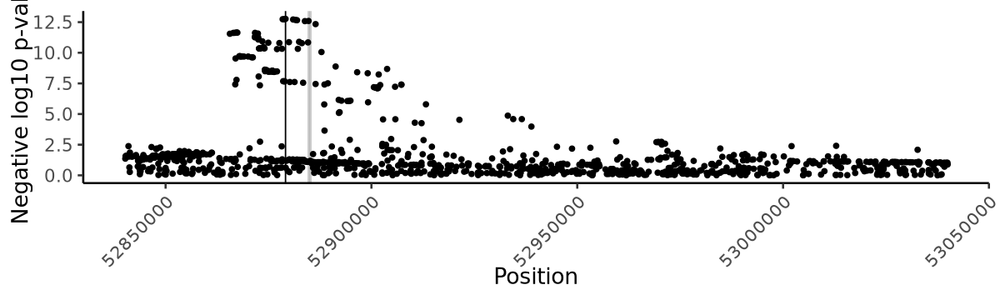

In [28]:
#chr12-52884847-52885147
options(repr.plot.width=10, repr.plot.height=3)
p1 <- ggplot(mutate(filter(ALT, chr.hg38 == 12 & pos.hg38 > 52840000 & pos.hg38 < 53040000), 
              cs.snp=RSID %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
      aes(x=pos.hg38, y=-log10(P), color=cs.snp)) + geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value") +
    xlim(c(52840000,53040000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_GWAS_200kb.pdf', width=10, height=3)
p1
dev.off()

In [ ]:
coloc.

Warning message:
“Removed 2672 rows containing missing values or values outside the scale range (`geom_point()`).”


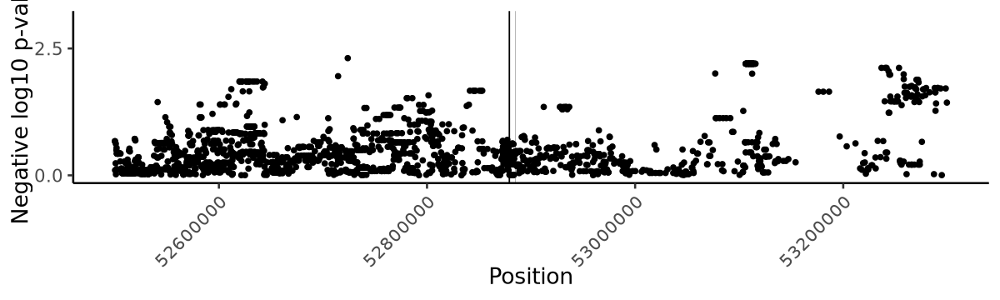

In [37]:
p1 <- ggplot(mutate(KRT8.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52840000,53040000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_eQTL_200kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2672 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2672 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

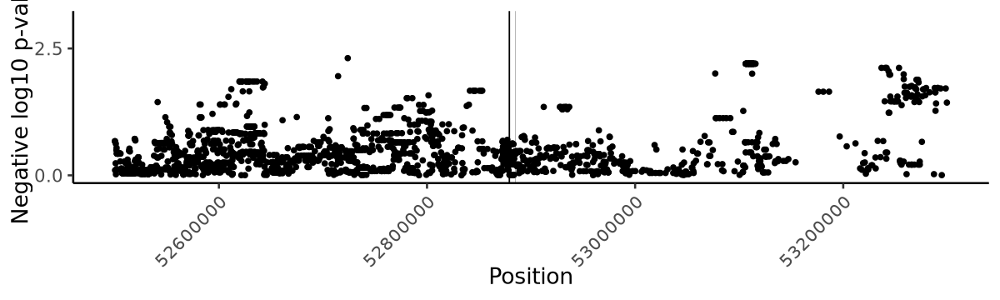

In [38]:
p1 <- ggplot(mutate(KRT8.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52500000,53300000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_eQTL_800kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 4188 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 4188 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

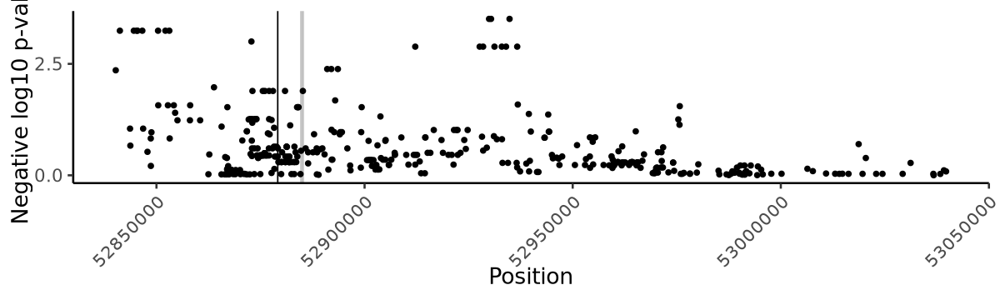

In [40]:
p1 <- ggplot(mutate(KRT18.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52840000,53040000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT18_Locus_Zoom_eQTL_200kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2676 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2676 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

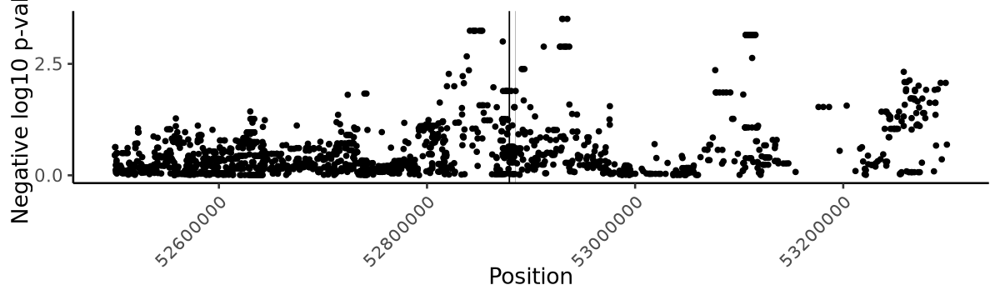

In [41]:
p1 <- ggplot(mutate(KRT18.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52500000,53300000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT18_Locus_Zoom_eQTL_800kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 4178 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 4178 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

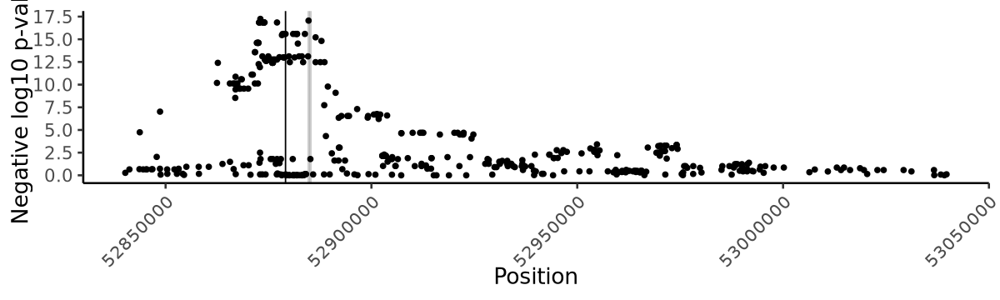

In [30]:
p1 <- ggplot(mutate(ATAC.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")   +
    xlim(c(52840000,53040000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_caQTL_200kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2666 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2666 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

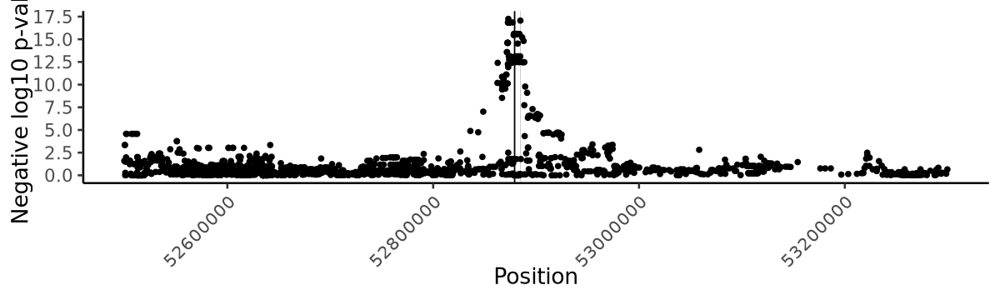

In [42]:
p1 <- ggplot(mutate(ATAC.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")   +
    xlim(c(52500000,53300000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_caQTL_800kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 4179 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 4179 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

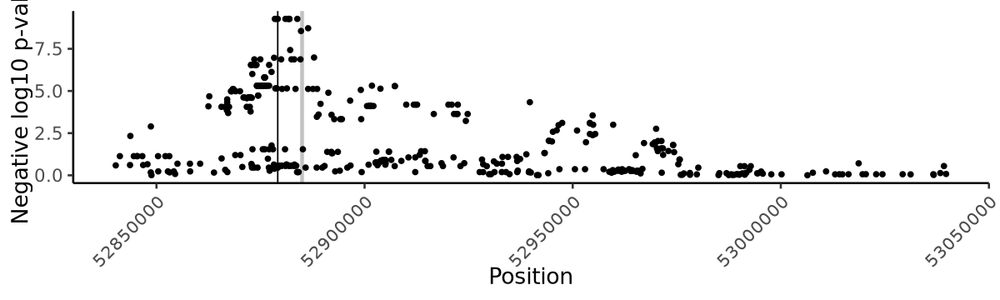

In [31]:
p1 <- ggplot(mutate(H3K27ac.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52840000,53040000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_H3K27acQTL_200kb.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2667 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2667 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

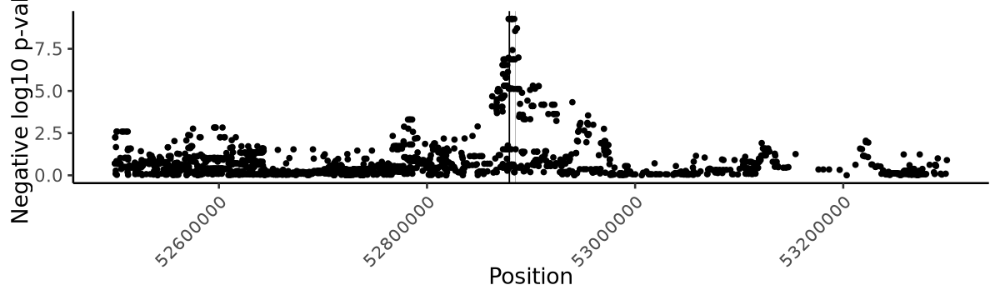

In [43]:
p1 <- ggplot(mutate(H3K27ac.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP=='rs4919741')$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='black',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(c(52500000,53300000)) + 
    geom_vline(xintercept = 52879136) +
    annotate("rect", xmin = 52884454, xmax = 52885453, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 52884847, xmax = 52885147, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_Locus_Zoom_H3K27acQTL_800kb.pdf', width=10, height=3)
p1
dev.off()

In [309]:
#options(repr.plot.width=8, repr.plot.height=3)
#
#
#p1 <- data.frame(mean=unlist(eQTL.post.mean[str_detect(rownames(eQTL.post.mean), 'KRT8'),]), 
#          sd=unlist(eQTL.post.sd[str_detect(rownames(eQTL.post.sd), 'KRT8'),]),
#          ct=colnames(eQTL.post.mean),
#          lfsr=unlist(eQTL.post.lfsr[str_detect(rownames(eQTL.post.lfsr), 'KRT8'),])) %>%
#    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
#    ggplot(aes(x=mean, y=ct, label=label)) + 
#        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
#        geom_point(aes(size=sqrt(1/(sd*sd)), color=ct),  shape = 15) +
#        theme_classic(base_size=20) +
#        labs(x='Mean', y='Cell Type') +
#        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
#        scale_color_manual(values=celltype_colors) +
#        geom_vline(xintercept = 0, linetype = 2) +
#        coord_flip() + geom_text(aes(hjust=-1.2, size=16))
#
#p1
#
#pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_eQTL_KRT8.pdf', width=8, height=3)
#p1
#dev.off()

ERROR: Error in data.frame(mean = unlist(eQTL.post.mean[str_detect(rownames(eQTL.post.mean), : arguments imply differing number of rows: 0, 8


pdf 
  2

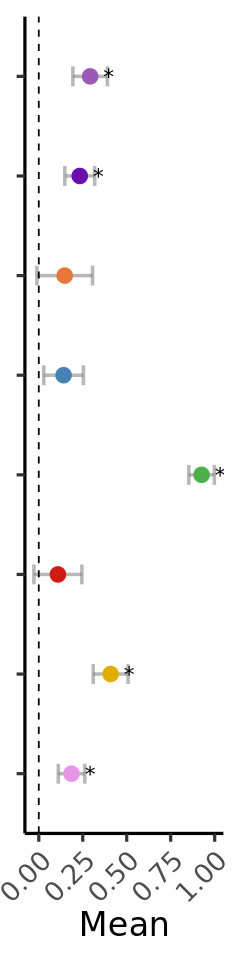

In [451]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(caQTL.post.mean[str_detect(rownames(caQTL.post.mean), 'chr12-52884847-52885147'),]), 
          sd=unlist(caQTL.post.sd[str_detect(rownames(caQTL.post.sd), 'chr12-52884847-52885147'),]),
          ct=colnames(caQTL.post.mean),
          lfsr=unlist(caQTL.post.lfsr[str_detect(rownames(caQTL.post.lfsr), 'chr12-52884847-52885147'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 8) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_caQTL_KRT8_flipped.pdf', width=2, height=8)
p1
dev.off()

pdf 
  2

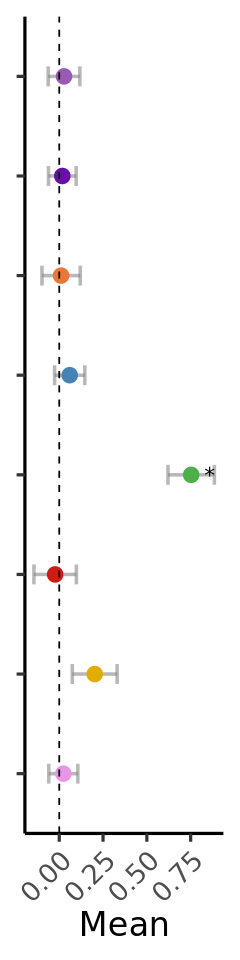

In [446]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(H3K27acQTL.post.mean[str_detect(rownames(H3K27acQTL.post.mean), 'chr12:52884454-52885453'),]), 
          sd=unlist(H3K27acQTL.post.sd[str_detect(rownames(H3K27acQTL.post.sd), 'chr12:52884454-52885453'),]),
          ct=colnames(H3K27acQTL.post.mean),
          lfsr=unlist(H3K27acQTL.post.lfsr[str_detect(rownames(H3K27acQTL.post.lfsr), 'chr12:52884454-52885453'),])) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 2) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_H3K27acQTL_KRT8_flipped.pdf', width=2, height=8)
p1
dev.off()

In [471]:
options(repr.plot.width=4, repr.plot.height=10)

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_eQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('KRT8','rs4919741', vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_caQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('chr12-52884847-52885147','rs4919741', vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM', ylims=c(0,18))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_H3K27acQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('chr12:52884454-52885453','rs4919741', vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
dev.off()

Warning message:
“Removed 47 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 106 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 30 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 88 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

# PPP2R3A

In [ ]:
rs687339	chr3:136213517	0.1955

In [8]:
atac.feat <- 'chr3-136213393-136213693'
ac.feat <- 'chr3:136212983-136213982'
variant <- 'rs687339'
cs.lead <- 'rs9867368'
chr <- 3

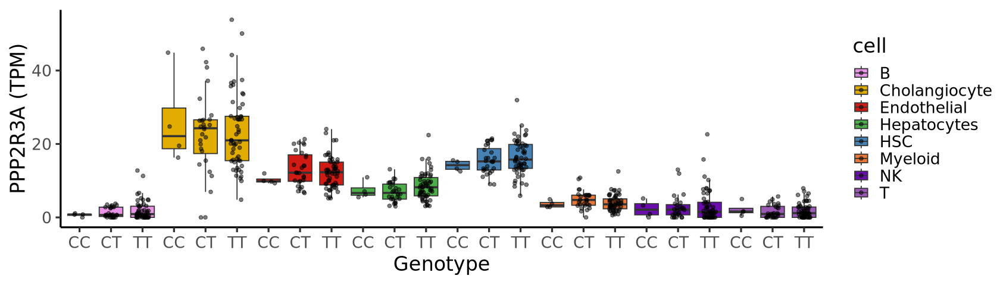

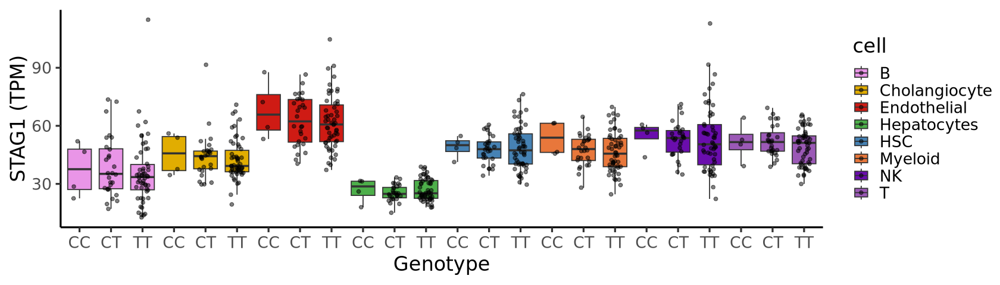

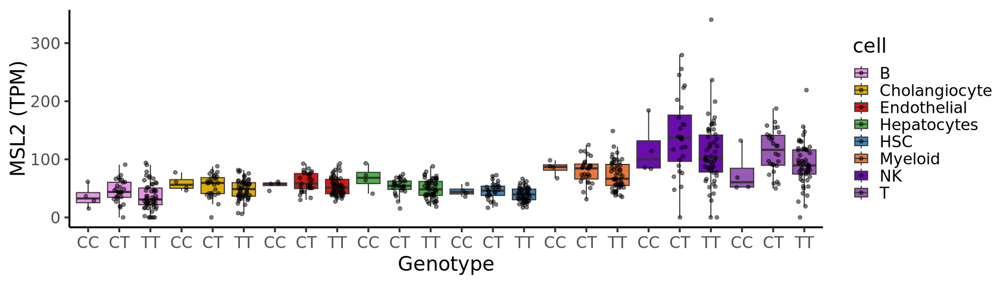

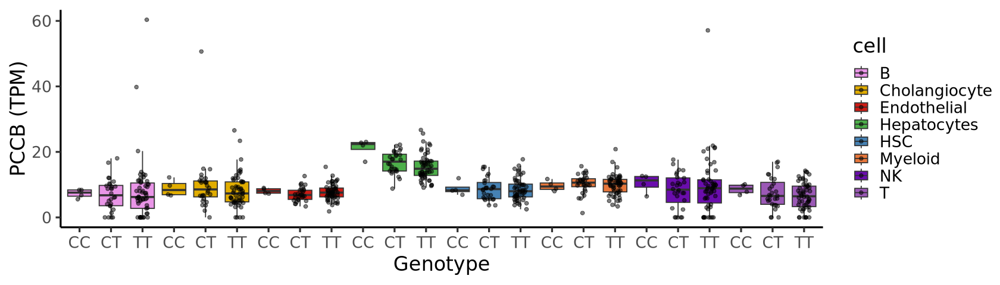

In [11]:
options(repr.plot.width=14, repr.plot.height=4)

#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_eQTL_boxplot.pdf', width=14, heigh=4)
qtl.boxplot('PPP2R3A',variant, vcf.df, 
                TPM, celltype_colors, 'TPM')
qtl.boxplot('STAG1',variant, vcf.df, 
                TPM, celltype_colors, 'TPM')
qtl.boxplot('MSL2',variant, vcf.df, 
                TPM, celltype_colors, 'TPM')
qtl.boxplot('PCCB',variant, vcf.df, 
                TPM, celltype_colors, 'TPM')
##dev.off()
##pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_caQTL_boxplot.pdf', width=14, heigh=4)
#qtl.boxplot('chr12-52884847-52885147','rs4919741', vcf.df, 
#                CPM.ATAC, celltype_colors, 'CPM')
##dev.off()
##pdf('/nfs/lab/welison/Liver/Plots/241220_WE_KRT8_H3K27acQTL_boxplot.pdf', width=14, heigh=4)
#qtl.boxplot('chr12:52884454-52885453','rs4919741', vcf.df, 
#                CPM.H3K27ac, celltype_colors, 'CPM')
##dev.off()

# Locus Zoom

In [473]:
STAG1.qtl.res <- vroom(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr',chr,'.parquet.tsv')) %>%
    filter(phenotype_id == 'STAG1')

dim(STAG1.qtl.res)
head(STAG1.qtl.res)

PPP2R3A.qtl.res <- vroom(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr',chr,'.parquet.tsv')) %>%
    filter(phenotype_id == 'PPP2R3A')

dim(PPP2R3A.qtl.res)
head(PPP2R3A.qtl.res)

Rows: 4622977 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 3109    9

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
STAG1,rs141615456,-998448,0.07558139,12,13,0.5599005,-0.097064140,0.1654427
STAG1,rs61789012,-997300,0.18604651,29,32,0.9526001,-0.007483397,0.1252997
STAG1,rs114908520,-996896,0.07558139,12,13,0.5599005,-0.097064140,0.1654427
STAG1,rs59165430,-992931,0.18604651,29,32,0.9526001,-0.007483397,0.1252997
STAG1,rs115453940,-991405,0.09302325,13,16,0.6715772,-0.058734060,0.1377592
STAG1,rs116784331,-990823,0.06976744,11,12,0.5302536,-0.108830035,0.1722624


Rows: 4622977 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (7): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 2776    9

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PPP2R3A,rs9289487,-999911,0.4883721,64,84,0.1237522,0.2208757,0.1412182
PPP2R3A,rs6782004,-999652,0.3372093,53,58,0.5485812,0.1023827,0.1695762
PPP2R3A,rs6439539,-999453,0.4883721,64,84,0.1237522,0.2208757,0.1412182
PPP2R3A,rs6782446,-999218,0.4767442,64,82,0.1159476,0.2299773,0.1438992
PPP2R3A,rs9875045,-998353,0.1395349,22,24,0.1234287,0.3317953,0.2119485
PPP2R3A,rs35531868,-997907,0.3372093,53,58,0.5485812,0.1023827,0.1695762


In [474]:
STAG1.qtl.res$snp.id <- rownames(vcf.df[match(STAG1.qtl.res$variant_id, vcf.df$ID),])
STAG1.qtl.res$pos <- as.numeric(str_split(STAG1.qtl.res$snp.id, ':', simplify=T)[,2])

dim(STAG1.qtl.res)
head(STAG1.qtl.res)

[1] 3109   11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
STAG1,rs141615456,-998448,0.07558139,12,13,0.5599005,-0.097064140,0.1654427,chr3:135753955:C:A,135753955
STAG1,rs61789012,-997300,0.18604651,29,32,0.9526001,-0.007483397,0.1252997,chr3:135755103:G:A,135755103
STAG1,rs114908520,-996896,0.07558139,12,13,0.5599005,-0.097064140,0.1654427,chr3:135755507:C:A,135755507
STAG1,rs59165430,-992931,0.18604651,29,32,0.9526001,-0.007483397,0.1252997,chr3:135759472:G:A,135759472
STAG1,rs115453940,-991405,0.09302325,13,16,0.6715772,-0.058734060,0.1377592,chr3:135760998:C:T,135760998
STAG1,rs116784331,-990823,0.06976744,11,12,0.5302536,-0.108830035,0.1722624,chr3:135761580:A:T,135761580


In [475]:
PPP2R3A.qtl.res$snp.id <- rownames(vcf.df[match(PPP2R3A.qtl.res$variant_id, vcf.df$ID),])
PPP2R3A.qtl.res$pos <- as.numeric(str_split(PPP2R3A.qtl.res$snp.id, ':', simplify=T)[,2])

dim(PPP2R3A.qtl.res)
head(PPP2R3A.qtl.res)

[1] 2776   11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
PPP2R3A,rs9289487,-999911,0.4883721,64,84,0.1237522,0.2208757,0.1412182,chr3:134965817:C:G,134965817
PPP2R3A,rs6782004,-999652,0.3372093,53,58,0.5485812,0.1023827,0.1695762,chr3:134966076:C:T,134966076
PPP2R3A,rs6439539,-999453,0.4883721,64,84,0.1237522,0.2208757,0.1412182,chr3:134966275:T:C,134966275
PPP2R3A,rs6782446,-999218,0.4767442,64,82,0.1159476,0.2299773,0.1438992,chr3:134966510:C:T,134966510
PPP2R3A,rs9875045,-998353,0.1395349,22,24,0.1234287,0.3317953,0.2119485,chr3:134967375:A:G,134967375
PPP2R3A,rs35531868,-997907,0.3372093,53,58,0.5485812,0.1023827,0.1695762,chr3:134967821:T:TG,134967821


In [476]:
ATAC.qtl.res <- paste0(vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr',chr,'.parquet.tsv')) %>%
    filter(phenotype_id == atac.feat)

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

Rows: 142644118 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 2850   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr3-136213393-136213693,rs4320080,-999322,-999621,0.67441860,44,56,0.03830980,-0.3889639,0.1830842
chr3-136213393-136213693,rs4309752,-998620,-998919,0.33720930,44,58,0.01216243,0.4591715,0.1768456
chr3-136213393-136213693,rs1962011,-998078,-998377,0.28488370,36,49,0.27318643,0.2007382,0.1812946
chr3-136213393-136213693,rs35624991,-997588,-997887,0.28488370,36,49,0.27318643,0.2007382,0.1812946
chr3-136213393-136213693,rs72630179,-997016,-997315,0.06395349,11,11,0.02492898,0.9102781,0.3943917
chr3-136213393-136213693,rs75159548,-996835,-997134,0.06395349,11,11,0.02492898,0.9102781,0.3943917


In [477]:
ATAC.qtl.res$snp.id <- rownames(vcf.df[match(ATAC.qtl.res$variant_id, vcf.df$ID),])
ATAC.qtl.res$pos <- as.numeric(str_split(ATAC.qtl.res$snp.id, ':', simplify=T)[,2])

dim(ATAC.qtl.res)
head(ATAC.qtl.res)

[1] 2850   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr3-136213393-136213693,rs4320080,-999322,-999621,0.67441860,44,56,0.03830980,-0.3889639,0.1830842,chr3:135214072:C:T,135214072
chr3-136213393-136213693,rs4309752,-998620,-998919,0.33720930,44,58,0.01216243,0.4591715,0.1768456,chr3:135214774:C:T,135214774
chr3-136213393-136213693,rs1962011,-998078,-998377,0.28488370,36,49,0.27318643,0.2007382,0.1812946,chr3:135215316:T:A,135215316
chr3-136213393-136213693,rs35624991,-997588,-997887,0.28488370,36,49,0.27318643,0.2007382,0.1812946,chr3:135215806:T:A,135215806
chr3-136213393-136213693,rs72630179,-997016,-997315,0.06395349,11,11,0.02492898,0.9102781,0.3943917,chr3:135216378:G:A,135216378
chr3-136213393-136213693,rs75159548,-996835,-997134,0.06395349,11,11,0.02492898,0.9102781,0.3943917,chr3:135216559:C:A,135216559


In [481]:
H3K27ac.qtl.res <- paste0(vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/tsv.test/Hepatocytes.cis_qtl_pairs.chr',chr,'.parquet.tsv')) %>%
    filter(phenotype_id == ac.feat)

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

Rows: 65411425 Columns: 10
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 2852   10

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr3:136212983-136213982,rs56080711,-999823,-1000821,0.1511628,20,26,0.30633676,-0.2428892,0.2351506
chr3:136212983-136213982,rs56046492,-999745,-1000743,0.1511628,20,26,0.30633676,-0.2428892,0.2351506
chr3:136212983-136213982,rs4320080,-998912,-999910,0.6744186,44,56,0.04636391,-0.3991766,0.1956900
chr3:136212983-136213982,rs4309752,-998210,-999208,0.3372093,44,58,0.01082463,0.5006705,0.1895424
chr3:136212983-136213982,rs1962011,-997668,-998666,0.2848837,36,49,0.08536923,0.3348901,0.1910286
chr3:136212983-136213982,rs35624991,-997178,-998176,0.2848837,36,49,0.08536923,0.3348901,0.1910286


In [482]:
H3K27ac.qtl.res$snp.id <- rownames(vcf.df[match(H3K27ac.qtl.res$variant_id, vcf.df$ID),])
H3K27ac.qtl.res$pos <- as.numeric(str_split(H3K27ac.qtl.res$snp.id, ':', simplify=T)[,2])

dim(H3K27ac.qtl.res)
head(H3K27ac.qtl.res)

[1] 2852   12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,snp.id,pos
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr3:136212983-136213982,rs56080711,-999823,-1000821,0.1511628,20,26,0.30633676,-0.2428892,0.2351506,chr3:135213161:T:G,135213161
chr3:136212983-136213982,rs56046492,-999745,-1000743,0.1511628,20,26,0.30633676,-0.2428892,0.2351506,chr3:135213239:T:C,135213239
chr3:136212983-136213982,rs4320080,-998912,-999910,0.6744186,44,56,0.04636391,-0.3991766,0.1956900,chr3:135214072:C:T,135214072
chr3:136212983-136213982,rs4309752,-998210,-999208,0.3372093,44,58,0.01082463,0.5006705,0.1895424,chr3:135214774:C:T,135214774
chr3:136212983-136213982,rs1962011,-997668,-998666,0.2848837,36,49,0.08536923,0.3348901,0.1910286,chr3:135215316:T:A,135215316
chr3:136212983-136213982,rs35624991,-997178,-998176,0.2848837,36,49,0.08536923,0.3348901,0.1910286,chr3:135215806:T:A,135215806


In [492]:
fine.mapping %>%
    filter(Chr==3)

CS.Type,LEAD.SNP,CS.SNP,Chr,Position,EA,NEA,EAF,Beta,SE,P,N,PP,Nominated.Gene,Biological.Prior.Gene,Not.in.Trans.Ethnic,chr.hg38,start.hg38,end.hg38
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>
,rs12486792,rs12486792,3,170677123,G,C,0.136,0.060,0.0109,2.95e-08,164197,3.49%,SLC2A2,SLC2A2,,3,170959333,170959334
,rs12486792,rs11925442,3,170687273,C,T,0.137,0.060,0.0108,3.29e-08,164197,3.38%,SLC2A2,SLC2A2,,3,170969483,170969484
,rs12486792,rs12496734,3,170693767,G,C,0.139,0.059,0.0107,4.55e-08,164197,2.53%,SLC2A2,SLC2A2,,3,170975977,170975978
,rs12486792,rs11720640,3,170694237,A,G,0.139,0.059,0.0107,4.53e-08,164197,2.53%,SLC2A2,SLC2A2,,3,170976447,170976448
,rs12486792,rs1905504,3,170695532,C,T,0.139,0.059,0.0107,4.59e-08,164197,2.53%,SLC2A2,SLC2A2,,3,170977742,170977743
,rs12486792,rs16855578,3,170684592,G,A,0.138,0.059,0.0108,4.06e-08,164197,2.49%,SLC2A2,SLC2A2,,3,170966802,170966803
,rs12486792,rs12495622,3,170684878,G,A,0.138,0.059,0.0108,4.16e-08,164197,2.49%,SLC2A2,SLC2A2,,3,170967088,170967089
,rs12486792,rs6780208,3,170686066,T,A,0.140,0.059,0.0108,4.03e-08,164197,2.49%,SLC2A2,SLC2A2,,3,170968276,170968277
,rs12486792,rs137914315,3,170687872,C,T,0.140,0.059,0.0108,4.06e-08,164197,2.49%,SLC2A2,SLC2A2,,3,170970082,170970083


In [520]:
region <- c(136135095,136357316)
region[2] - region[1]

[1] 222221

Warning message:
“Removed 859643 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 859643 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

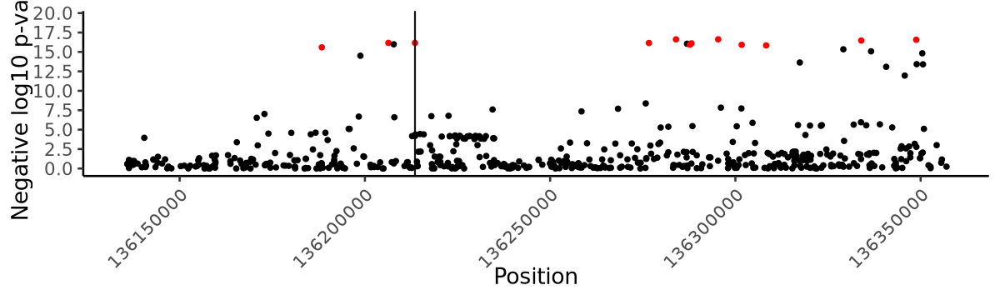

In [521]:
options(repr.plot.width=10, repr.plot.height=3)
p1 <- ggplot(mutate(filter(ALT, chr.hg38 == 3), 
              cs.snp=RSID %in% filter(fine.mapping, LEAD.SNP==cs.lead)$CS.SNP), 
      aes(x=pos.hg38, y=-log10(P), color=cs.snp)) + geom_point() + 
    scale_color_manual(values=c(`TRUE`='red',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value") +
    xlim(region) + 
    geom_vline(xintercept = 136213517) +
    annotate("rect", xmin = 136213393, xmax = 136213693, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 136212983, xmax = 136213982, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_Locus_Zoom_NAFLD.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2935 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2935 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

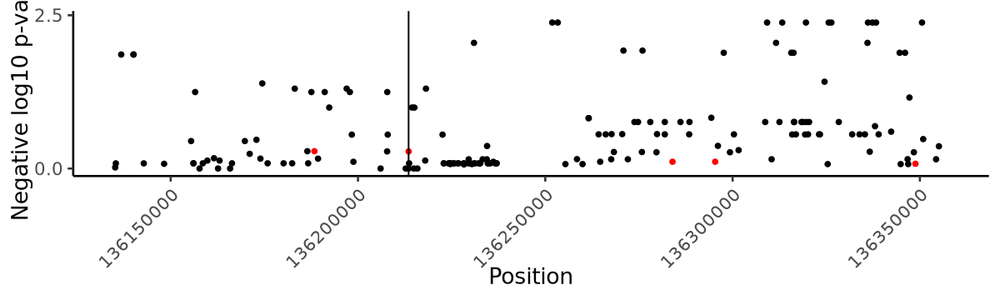

In [522]:
p1 <- ggplot(mutate(STAG1.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP==cs.lead)$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='red',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(region) + 
    geom_vline(xintercept = 136213517) +
    annotate("rect", xmin = 136213393, xmax = 136213693, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 136212983, xmax = 136213982, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_Locus_Zoom_eQTL_STAG1.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2602 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2602 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

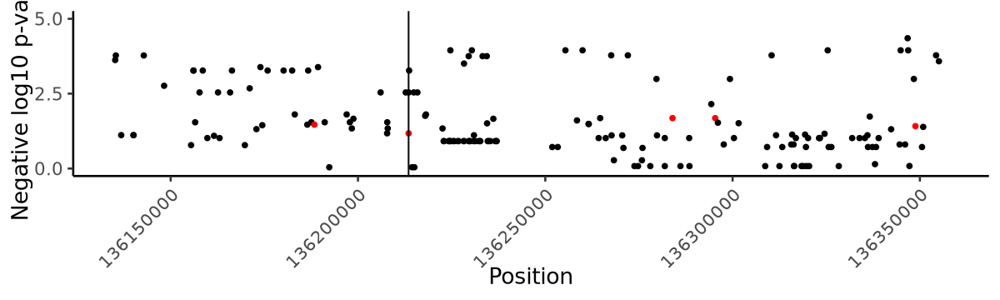

In [523]:
p1 <- ggplot(mutate(PPP2R3A.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP==cs.lead)$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='red',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(region) + 
    geom_vline(xintercept = 136213517) +
    annotate("rect", xmin = 136213393, xmax = 136213693, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 136212983, xmax = 136213982, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))
p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_Locus_Zoom_eQTL_PPP2R3A.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2676 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2676 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

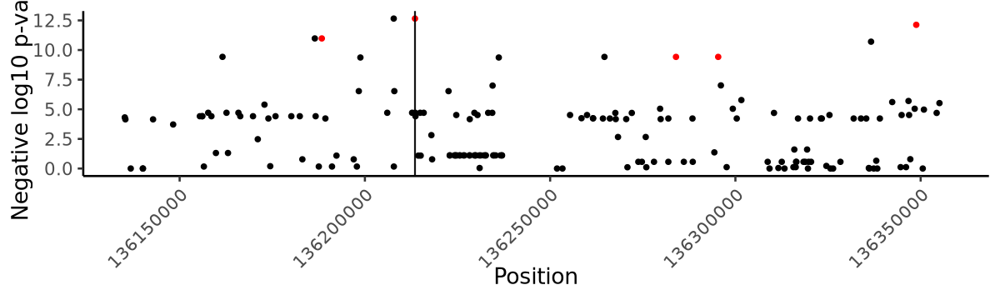

In [524]:
p1 <- ggplot(mutate(ATAC.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP==cs.lead)$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='red',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")   +
    xlim(region) + 
    geom_vline(xintercept = 136213517) +
    annotate("rect", xmin = 136213393, xmax = 136213693, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 136212983, xmax = 136213982, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_Locus_Zoom_caQTL.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Removed 2678 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 2678 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

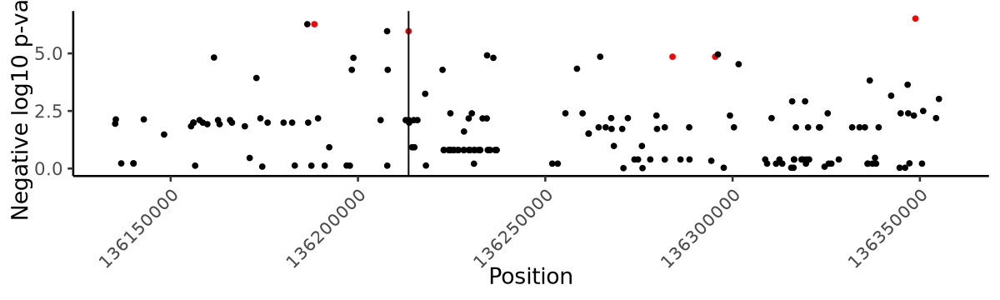

In [525]:
p1 <- ggplot(mutate(H3K27ac.qtl.res,cs.snp=variant_id %in% filter(fine.mapping, LEAD.SNP==cs.lead)$CS.SNP), 
       aes(x=pos, y=-log10(pval_nominal), color=cs.snp)) + 
    geom_point() + 
    scale_color_manual(values=c(`TRUE`='red',`FALSE`='black')) +
    theme_classic(base_size=16) +
    labs(x="Position",y="Negative log10 p-value")  +
    xlim(region) + 
    geom_vline(xintercept = 136213517) +
    annotate("rect", xmin = 136213393, xmax = 136213693, ymin = -Inf, ymax = Inf, alpha = .2, fill='black') +
    annotate("rect", xmin = 136212983, xmax = 136213982, ymin = -Inf, ymax = Inf, alpha = .1, fill='black') +
    theme(legend.position='none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_y_continuous(breaks = seq(0, 25, by = 2.5))

p1

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_Locus_Zoom_H3K27acQTL.pdf', width=10, height=3)
p1
dev.off()

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


pdf 
  2

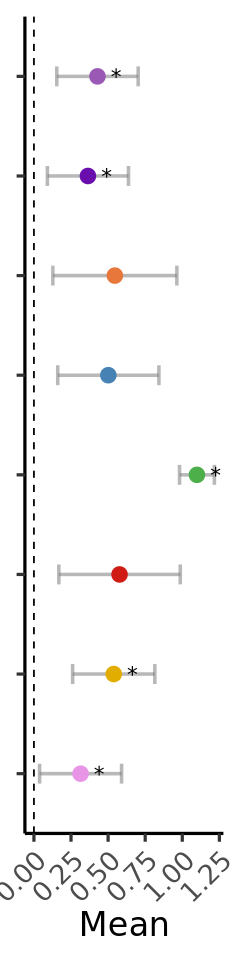

In [17]:
options(repr.plot.width=2, repr.plot.height=8)

p1 <- data.frame(mean=unlist(caQTL.post.mean[str_detect(rownames(caQTL.post.mean), atac.feat),]), 
          sd=unlist(caQTL.post.sd[str_detect(rownames(caQTL.post.sd), atac.feat),]),
          ct=colnames(caQTL.post.mean),
          lfsr=unlist(caQTL.post.lfsr[str_detect(rownames(caQTL.post.lfsr), atac.feat),])) %>%
    mutate(mean = mean * -1) %>%
    mutate(low=mean-sd,high=mean+sd, label=ifelse(lfsr < 0.05, '*','')) %>%
    ggplot(aes(x=mean, y=ct, label=label)) + 
        geom_errorbarh(aes(xmin = low, xmax = high, alpha=.4, color='grey'), height = 0.2, size=1) +
        geom_point(aes(color=ct), size=4) +
        theme_classic(base_size=20) +
        labs(x='Mean', y=NULL) +
        theme(legend.position = 'none', axis.text.x = element_text(angle = 45, vjust = 1, hjust=1),
             axis.text.y = element_blank()) +
        scale_color_manual(values=celltype_colors) +
        geom_vline(xintercept = 0, linetype = 8) +
        geom_text(aes(hjust=-1.2, size=200))

p1

pdf('/nfs/lab/welison/Liver/Plots/241221_WE_mashr_caQTL_PPP2R3A_flipped.pdf', width=2, height=8)
p1
dev.off()

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 38 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 269 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 269 rows containing missing values or values outside the scale range (`geom_point()`).”


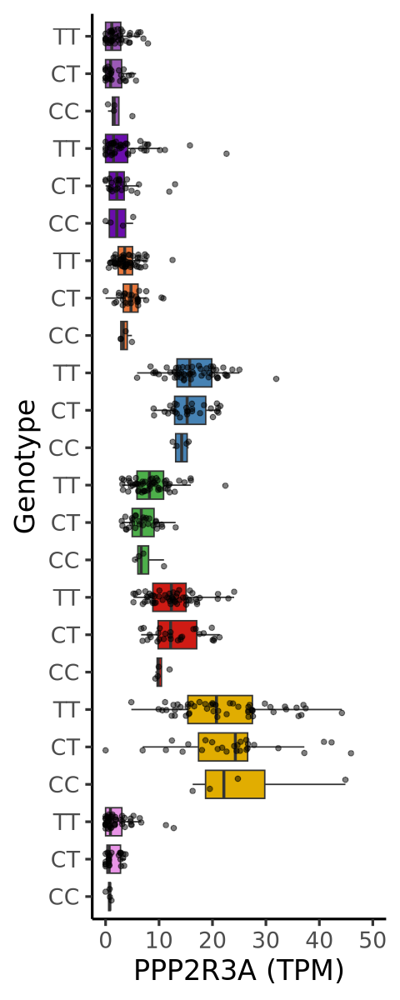

Warning message:
“Removed 206 rows containing missing values or values outside the scale range (`geom_point()`).”


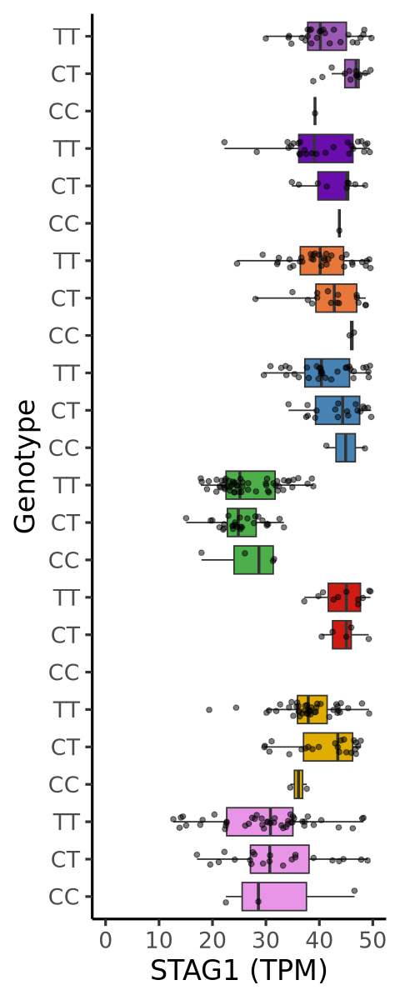

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


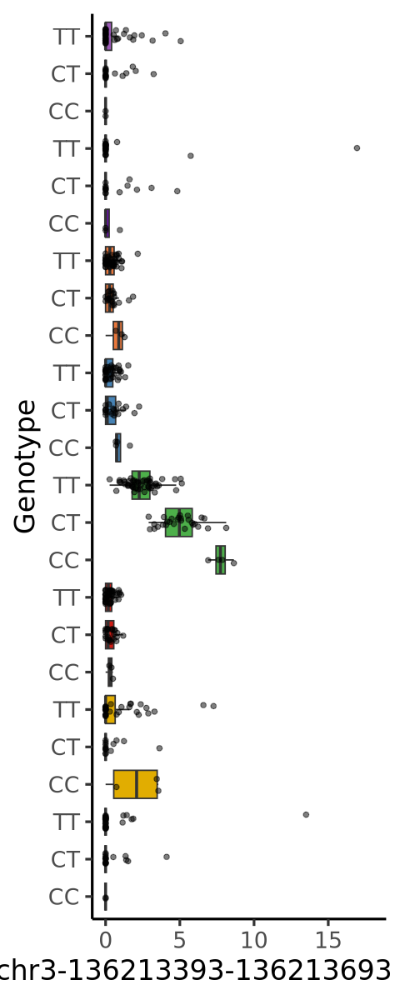

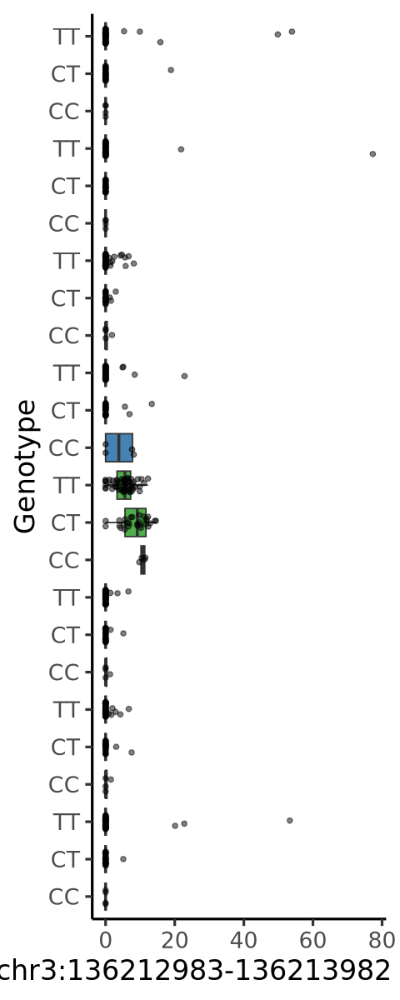

In [508]:
options(repr.plot.width=4, repr.plot.height=10)

#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_eQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('PPP2R3A',variant, vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
qtl.boxplot.flip('STAG1',variant, vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
#dev.off()
#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_caQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip(atac.feat,variant, vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM', ylims=c(0,18))
#dev.off()
#pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_H3K27acQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip(ac.feat,variant, vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
#dev.off()

In [510]:
options(repr.plot.width=4, repr.plot.height=10)

pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_eQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip('PPP2R3A',variant, vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
qtl.boxplot.flip('STAG1',variant, vcf.df, 
                TPM, celltype_colors, 'TPM', ylims=c(0,50))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_caQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip(atac.feat,variant, vcf.df, 
                CPM.ATAC, celltype_colors, 'CPM', ylims=c(0,18))
dev.off()
pdf('/nfs/lab/welison/Liver/Plots/241220_WE_PPP2R3A_H3K27acQTL_boxplot_flip.pdf', width=4, heigh=10)
qtl.boxplot.flip(ac.feat,variant, vcf.df, 
                CPM.H3K27ac, celltype_colors, 'CPM')
dev.off()

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 269 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 269 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 203 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2

Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


pdf 
  2